In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model
# !pip install -U tensorflow
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, confusion_matrix
import seaborn as sns
from keras.callbacks import LearningRateScheduler
from keras.callbacks import History

from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization
from keras.regularizers import l2
from tensorflow.keras.utils import plot_model
!pip install lime
from lime import lime_image
from skimage.segmentation import mark_boundaries
import pickle


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=428efc5e871c6e73da7612d723d7f468d06772864cef879fd90ec94dd24ecbf0
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Define the paths to your train and val directories
train_dir = '/content/drive/MyDrive/NCKU/Healthcare/HW2/Dataset/Train'
val_dir = '/content/drive/MyDrive/NCKU/Healthcare/HW2/Dataset/Val'
test_dir = '/content/drive/MyDrive/NCKU/Healthcare/HW2/Dataset/Prediction/Test'
test_dir2 = '/content/drive/MyDrive/NCKU/Healthcare/HW2/Dataset/Test'

# Check if directories exist and are not empty
assert os.path.exists(train_dir) and len(os.listdir(train_dir)) > 0, "Training directory is empty or does not exist"
assert os.path.exists(val_dir) and len(os.listdir(val_dir)) > 0, "Validation directory is empty or does not exist"
assert os.path.exists(test_dir) and len(os.listdir(test_dir)) > 0, "Test directory is empty or does not exist"

In [ ]:
# Initialize ImageDataGenerators
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    zoom_range=0.2,
    horizontal_flip=True
)

test_datagen = ImageDataGenerator(rescale=1. / 255)

# Load training data
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    shuffle=True  # Shuffle training data
)

# Load validation data
validation_generator = test_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=16,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
      test_dir2,
      target_size=(224, 224),
      shuffle=False,
      class_mode='binary',
      batch_size=32
      )

# Check class indices to ensure correct label mapping
print("Training class indices:", train_generator.class_indices)
print("Validation class indices:", validation_generator.class_indices)
print("Test class indices:", test_generator.class_indices)

Found 288 images belonging to 2 classes.
Found 60 images belonging to 2 classes.
Found 23 images belonging to 2 classes.
Training class indices: {'0_Normal': 0, '1_Covid': 1}
Validation class indices: {'0_Normal': 0, '1_Covid': 1}
Test class indices: {'0_Normal': 0, '1_Covid': 1}


In [ ]:
# Calculate steps per epoch
steps_per_epoch = train_generator.samples // train_generator.batch_size
validation_steps = validation_generator.samples // validation_generator.batch_size

# Print calculated steps
print(f"Steps per epoch: {steps_per_epoch}")
print(f"Validation steps: {validation_steps}")

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=0.00001
)

Steps per epoch: 9
Validation steps: 3


In [ ]:
def save_model_to_drive(model, save_folder, model_name):
    # Save the model to the specified path
    save_path = os.path.join(save_folder, model_name)
    model.save(save_path)
    print(f"Model saved successfully to: {save_path}")

def load_model_from_drive(model_name, save_folder):
    # Load the model from the specified path
    load_path = os.path.join(save_folder, model_name)
    loaded_model = tf.keras.models.load_model(load_path)
    print(f"Model loaded successfully from: {load_path}")
    return loaded_model

In [ ]:
vgg16_base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model
for layer in vgg16_base_model.layers:
    layer.trainable = False

# Add custom layers on top of the base model
vgg16_model = Sequential([
    vgg16_base_model,
    GlobalAveragePooling2D(),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

vgg16_model.compile(optimizer=Adam(learning_rate=0.1), loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
vgg_history = vgg16_model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    validation_data=validation_generator,
    validation_steps=validation_steps,
    epochs=10,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/10
9/9 [==============================] - 241s 27s/step - loss: 1.6909 - accuracy: 0.5764 - val_loss: 0.6636 - val_accuracy: 0.5417 - lr: 0.1000
Epoch 2/10
9/9 [==============================] - 268s 31s/step - loss: 0.5806 - accuracy: 0.5938 - val_loss: 0.5132 - val_accuracy: 0.9167 - lr: 0.1000
Epoch 3/10
9/9 [==============================] - 311s 34s/step - loss: 0.5208 - accuracy: 0.7361 - val_loss: 0.4106 - val_accuracy: 0.9583 - lr: 0.1000
Epoch 4/10
9/9 [==============================] - 245s 28s/step - loss: 0.5416 - accuracy: 0.7014 - val_loss: 0.3099 - val_accuracy: 0.9583 - lr: 0.1000
Epoch 5/10
9/9 [==============================] - 240s 27s/step - loss: 0.5027 - accuracy: 0.7500 - val_loss: 0.2257 - val_accuracy: 0.9167 - lr: 0.1000
Epoch 6/10
9/9 [==============================] - 257s 28s/step - loss: 0.5680 - accuracy: 0.7014 - val_loss: 0.2556 - val_accuracy: 1.0000 - lr: 0.1000
Epoch 7/10
9/9 [==============================] - 245s 28s/step - loss: 0.5293 - a

In [ ]:
plot_learning_curves(vgg_history)

NameError: name 'vgg_history' is not defined

In [ ]:
vgg16_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_1  (None, 512)               0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_2 (Dense)             (None, 64)                32832     
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 14747585 (56.26 MB)
Trainable params: 32897 (128.50 KB)
Non-trainable params: 14714688 (56.13 MB)
________

In [ ]:
dir = '/content/drive/MyDrive/NCKU/Healthcare/HW2'
# save_model_to_drive(vgg16_model, dir, 'vgg16_model.keras')
vgg16_model = load_model_from_drive('vgg16_model.keras',dir )

Model loaded successfully from: /content/drive/MyDrive/NCKU/Healthcare/HW2/vgg16_model.keras


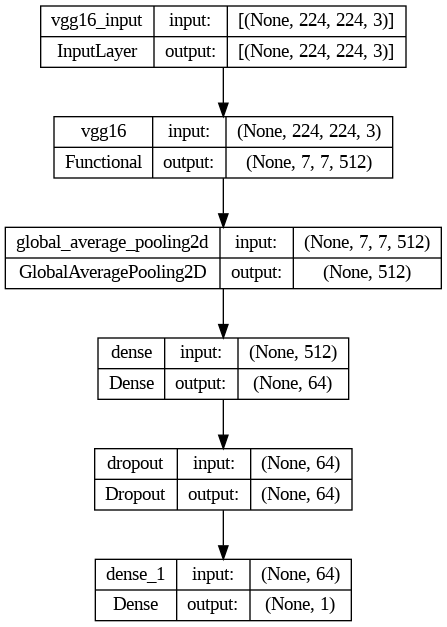

In [ ]:
# plot_model(vgg16_model, to_file='vgg16_model.png', show_shapes=True, show_layer_names=True)

In [ ]:
def extract_test_images(dir):
    images=[]
    image_names=[]
    for img_name in os.listdir(dir):
        img_path = os.path.join(dir, img_name)
        img = load_img(img_path, target_size=(224, 224))  # Load image with target size
        images.append(img)
        # images.append(img)
        image_names.append(img_name)
    return images, image_names

def analyze_image_properties(images):
    dimensions = [img.size for img in images]
    widths, heights = zip(*dimensions)

    print(f'Average width: {np.mean(widths)}')
    print(f'Average height: {np.mean(heights)}')
    print(f'Min width: {np.min(widths)}, Max width: {np.max(widths)}')
    print(f'Min height: {np.min(heights)}, Max height: {np.max(heights)}')

    plt.hist(widths, bins=20, alpha=0.5, label='Widths')
    plt.hist(heights, bins=20, alpha=0.5, label='Heights')
    plt.legend(loc='upper right')
    plt.title('Distribution of Image Dimensions')
    plt.xlabel('Pixels')
    plt.ylabel('Frequency')
    plt.show()

def predict(model, test_images, test_images_names):
    ground_truths = []
    test_images_arr = list(map(lambda img: (img_to_array(img) / 255.0), test_images))
    for i in range(len(test_images_arr)):
        img_name = test_images_names[i]

        # Determine ground truth from image name
        if img_name.startswith('ryct'):
            ground_truths.append(1)  # Covid
        else:
            ground_truths.append(0)  # Normal

    test_images_arr = np.array(test_images_arr)  # Stack images into a single array
    predictions = model.predict(test_images_arr)
    return predictions, ground_truths

def plot_predictions(predictions, ground_truths, test_images):
    predicted_classes = np.where(predictions > 0.5, 1, 0)

    # Plot images with predictions and ground truth
    num_images = len(predictions)
    # num_cols = 4
    # num_rows = (num_images + num_cols - 1) // num_cols  # Calculate number of rows needed
    num_cols = 6
    num_rows = 4

    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(16, 4 * num_rows))

    for i in range(num_rows):
        for j in range(num_cols):
            idx = i * num_cols + j
            if idx < num_images:
                ax = axes[i, j] if num_rows > 1 else axes[j]
                ax.imshow(test_images[idx])
                ax.set_title(f'Prediction: {"Covid" if predicted_classes[idx] == 1 else "Normal"}\nScore = {predictions[idx]}\nGround Truth: {ground_truths[idx]}')
                ax.axis('off')
            else:
                ax.axis('off')  # Disable empty subplot

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_learning_curves(history):
    plt.figure(figsize=(12, 6))

    # Plot training & validation accuracy values
    plt.subplot(1, 3, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')

    # Plot training & validation loss values
    plt.subplot(1, 3, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')

    plt.subplot(1, 3, 3)
    plt.plot(history.history['lr'], label='Learning Rate')
    plt.plot(history.history['lr'], label='Learning Rate')
    plt.title('Model Learning Rate')
    plt.xlabel('Epoch')
    plt.ylabel('LR')
    plt.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

def evaluate_metrics(y_true, y_pred_proba, threshold=0.5):
    y_pred = (y_pred_proba >= threshold).astype(int)

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    sensitivity = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    roc_auc = roc_auc_score(y_true, y_pred_proba)

    # Calculate specificity
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    specificity = tn / (tn + fp)

    return accuracy, precision, sensitivity, specificity, f1, roc_auc

def plot_confusion_matrix(y_true, y_pred_proba, threshold=0.5):
    y_pred = (y_pred_proba >= threshold).astype(int)
    cm = confusion_matrix(y_true, y_pred)

    # Extract TP, TN, FP, FN
    TN, FP, FN, TP = cm.ravel()

    # Print TP, TN, FP, FN
    print(f'True Positives (TP): {TP}')
    print(f'True Negatives (TN): {TN}')
    print(f'False Positives (FP): {FP}')
    print(f'False Negatives (FN): {FN}')

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False,
                xticklabels=['Normal', 'COVID'], yticklabels=['Normal', 'COVID'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

def plot_roc_curve(y_true, y_pred_proba):
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_proba)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = {:.2f})'.format(roc_auc_score(y_true, y_pred_proba)))
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.show()

def find_optimal_threshold(y_true, y_pred_proba):
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_proba)
    roc_auc_values = [roc_auc_score(y_true, y_pred_proba >= threshold) for threshold in thresholds]
    optimal_threshold = thresholds[np.argmax(roc_auc_values)]

    return optimal_threshold

###############################LIME PART################################################################################

def extract_and_preprocess_images(image_dir):
    normal_images = {}
    covid_images = {}
    for img_name in os.listdir(image_dir):
      image_path = os.path.join(image_dir, img_name)
      img = load_img(image_path, target_size=(224, 224))
      img = img_to_array(img)
      img = np.expand_dims(img, axis=0)
      img = img / 255.0
      if img_name.startswith('ryct'):
          covid_images[img_name] = img
      else:
          normal_images[img_name] = img

    return normal_images, covid_images

def explain_image(model, image, num_samples=1000, top_labels=5, hide_color=0):
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(image.astype('double'),
                                             model.predict,
                                             top_labels=top_labels,
                                             hide_color=hide_color,
                                             num_samples=num_samples)
    return explanation

def visualize_explanation(explanation, title, num_features=5, positive_only=True, hide_rest=False):
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=positive_only, num_features=num_features, hide_rest=hide_rest)
    plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
    plt.title(title)
    plt.axis('off')
    plt.show()

def visualize_explanation_heatmap(explanation, title):
  #Select the same class explained on the figures above.
  ind =  explanation.top_labels[0]
  #Map each explanation weight to the corresponding superpixel
  dict_heatmap = dict(explanation.local_exp[ind])
  heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)
  #Plot. The visualization makes more sense if a symmetrical colorbar is used.
  plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
  plt.colorbar()
  plt.title(title)
  plt.axis('off')
  plt.show()

def save_explanation(explanation, img_name, model_name, save_dir='/content/drive/MyDrive/NCKU/Healthcare/HW2/explanations/'):
    normal_path = '/0_normal/'
    covid_path = '/1_covid/'
    if model_name.startswith('vgg'):
        save_dir = save_dir + 'vgg16/'
    else:
        save_dir = save_dir + 'cnn/'

    if img_name.startswith('ryct'):
        save_path = save_dir + covid_path + img_name + '.pkl'
    else:
        save_path = save_dir + normal_path + img_name + '.pkl'

    with open(save_path, 'wb') as f:
        pickle.dump(explanation, f)

def load_explanation(img_name, model_name, save_dir='/content/drive/MyDrive/NCKU/Healthcare/HW2/explanations/'):
    normal_path = '/0_normal/'
    covid_path = '/1_covid/'
    if model_name.startswith('vgg'):
        save_dir = save_dir + 'vgg16/'
    else:
        save_dir = save_dir + 'cnn/'

    if img_name.startswith('ryct'):
        load_path = save_dir + covid_path + img_name + '.pkl'
    else:
        load_path = save_dir + normal_path + img_name + '.pkl'

    with open(load_path, 'rb') as f:
        explanation = pickle.load(f)

    return explanation

def visualize_explanation_subplot(ax, explanation, title, num_features=5, positive_only=True, hide_rest=False):
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=positive_only, num_features=num_features, hide_rest=hide_rest)
    ax.imshow(mark_boundaries(temp / 2 + 0.5, mask))
    ax.set_title(title, fontsize=16)
    ax.axis('off')

In [ ]:
test_images, test_images_names = extract_test_images(test_dir)

1/1 [==============================] - 36s 36s/step


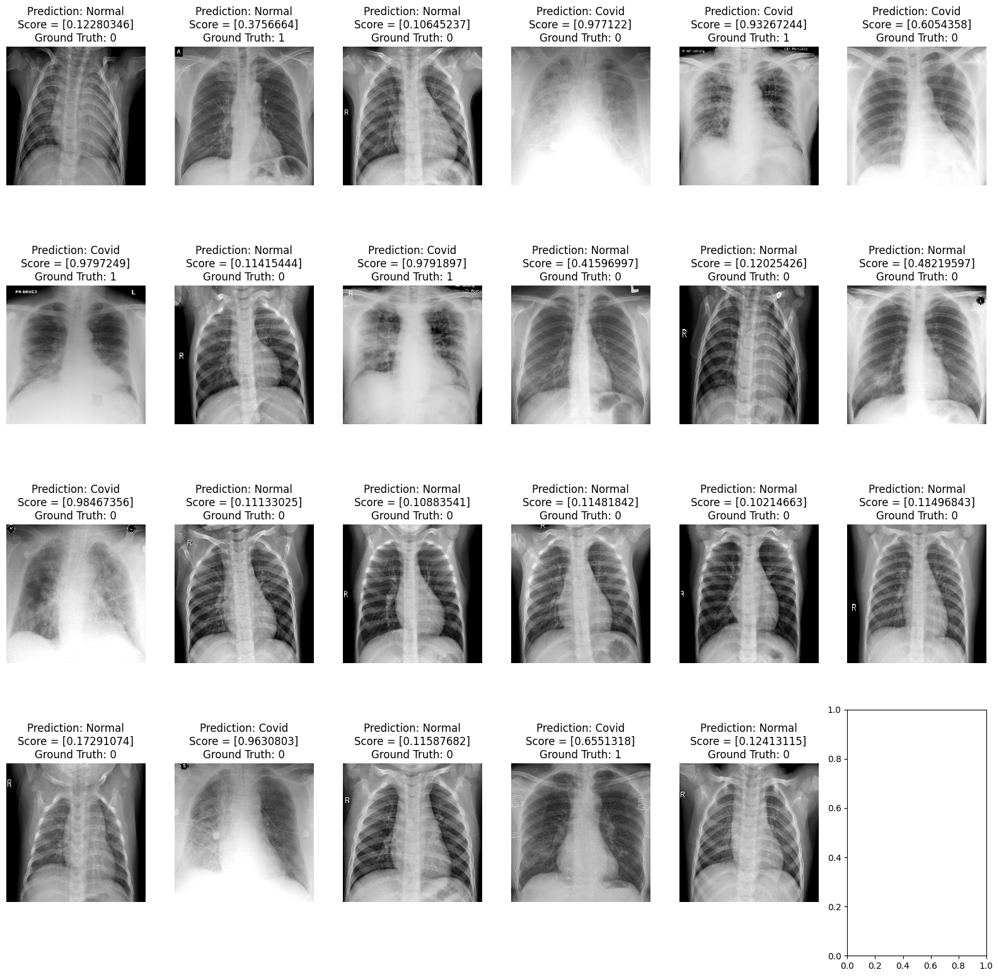

In [ ]:
# Example usage after training the model
vgg16_predictions, ground_truth = predict(vgg16_model, test_images, test_images_names)
plot_predictions(vgg16_predictions, ground_truth, test_images)

Accuracy: 0.78, Precision: 0.50, Sensitivity: 0.80, Specificity: 0.78, F1 score: 0.62, ROC AUC: 0.84
True Positives (TP): 4
True Negatives (TN): 14
False Positives (FP): 4
False Negatives (FN): 1


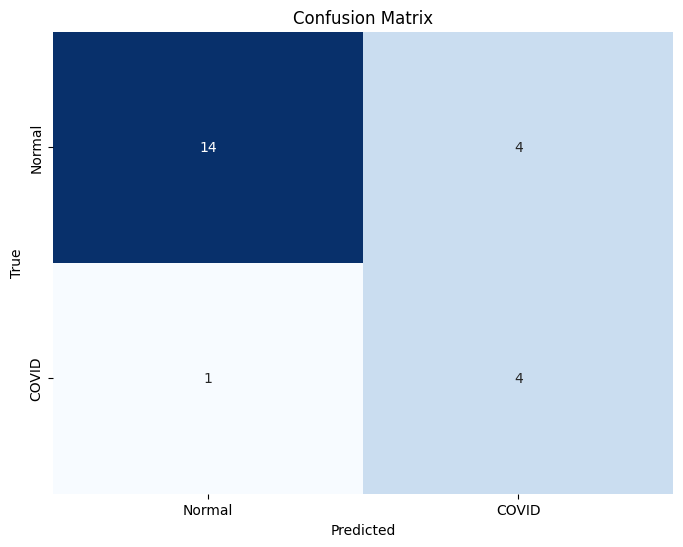

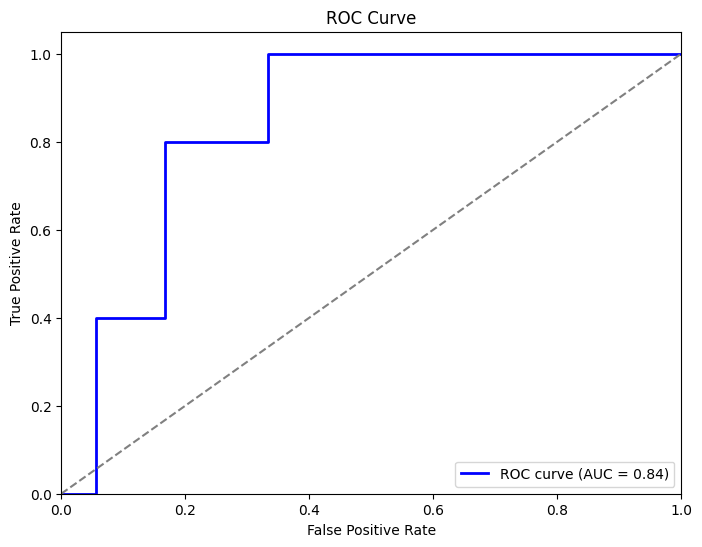

Optimal Threshold: 0.38


In [ ]:
# Calculate evaluation metrics
accuracy, precision, sensitivity,specificity, f1, roc_auc = evaluate_metrics(ground_truth, vgg16_predictions)
print(f'Accuracy: {accuracy:.2f}, Precision: {precision:.2f}, Sensitivity: {sensitivity:.2f}, Specificity: {specificity:.2f}, F1 score: {f1:.2f}, ROC AUC: {roc_auc:.2f}')

# Plot confusion matrix
plot_confusion_matrix(ground_truth, vgg16_predictions)

# Plot ROC curve
plot_roc_curve(ground_truth, vgg16_predictions)

# Find optimal threshold based on ROC AUC
optimal_threshold_vgg16 = find_optimal_threshold(ground_truth, vgg16_predictions)
print(f'Optimal Threshold: {optimal_threshold_vgg16:.2f}')

In [ ]:
normal_img_dict, covid_img_dict = extract_and_preprocess_images(test_dir)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 7s 7s/step


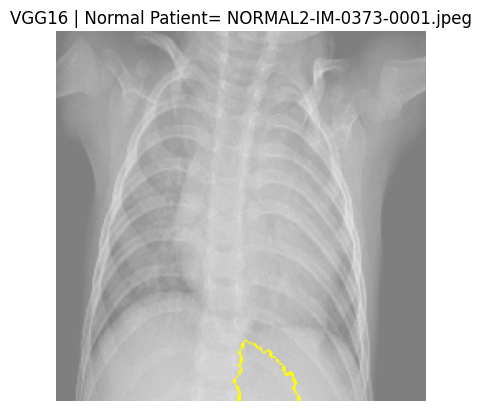

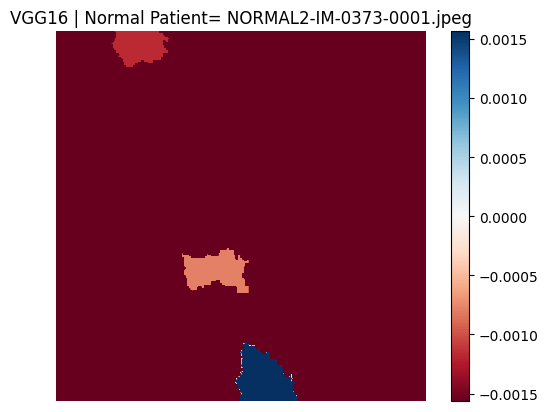

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 6s 6s/step


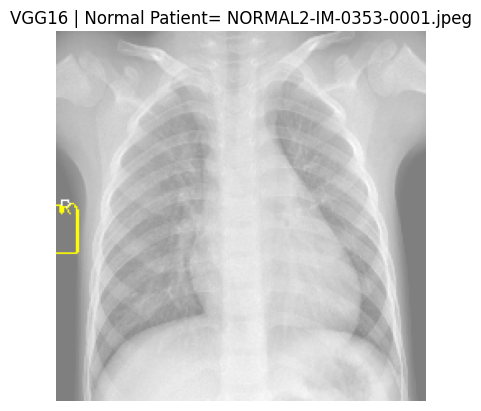

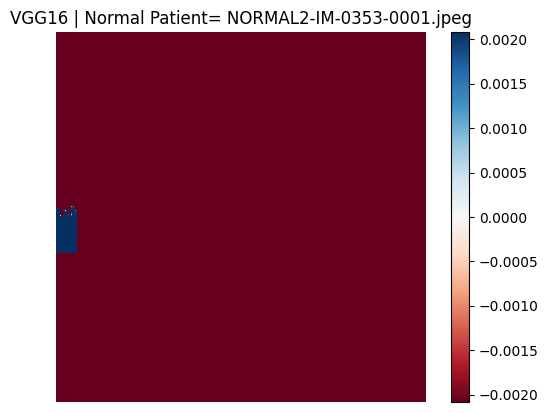

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 7s 7s/step


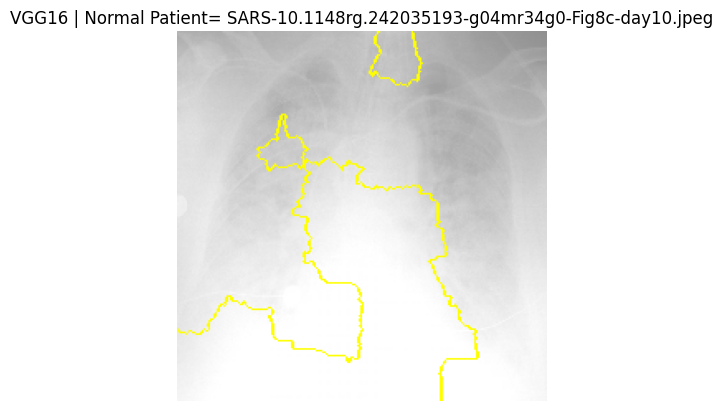

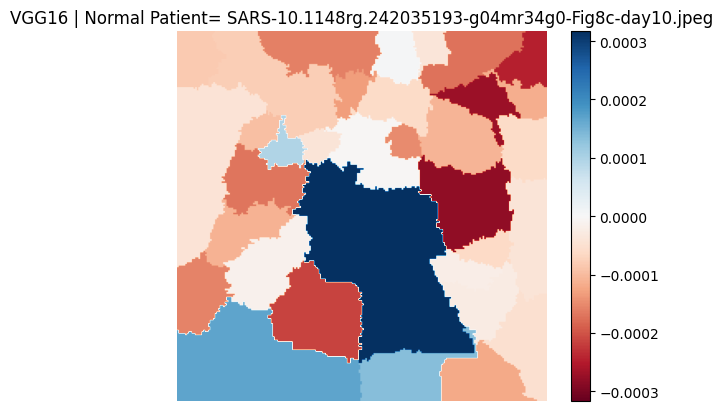

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 5s 5s/step


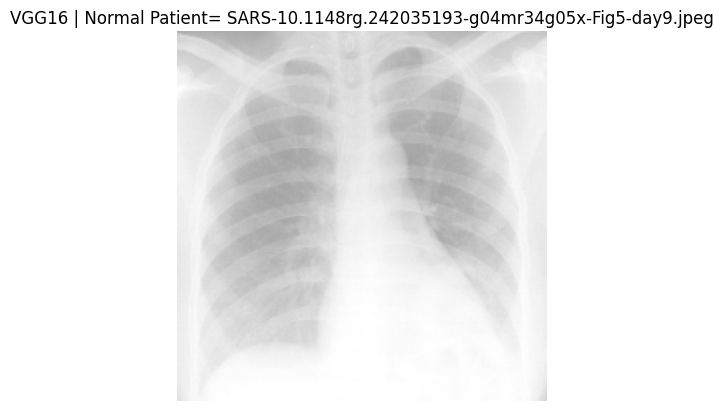

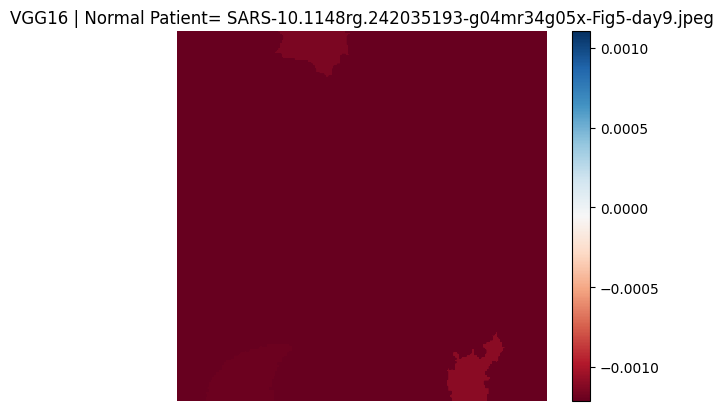

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 8s 8s/step


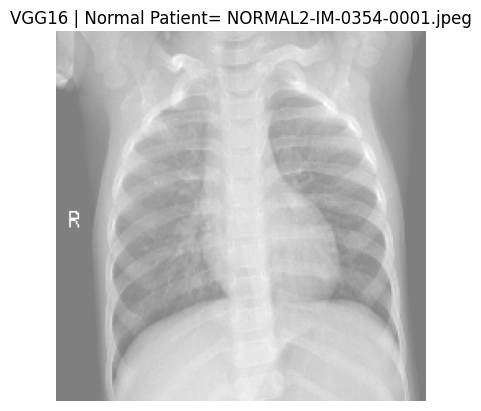

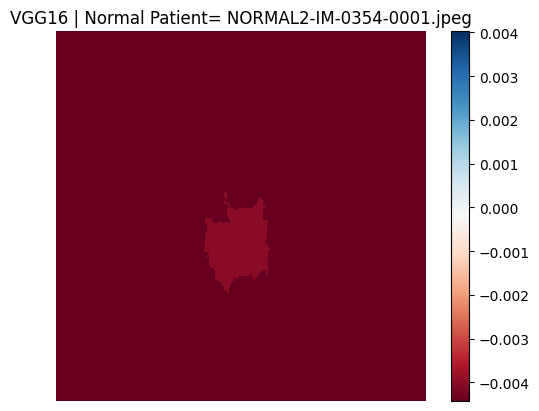

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 6s 6s/step


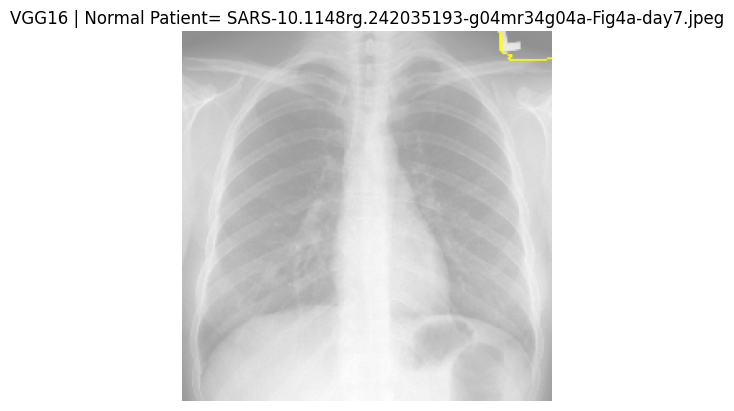

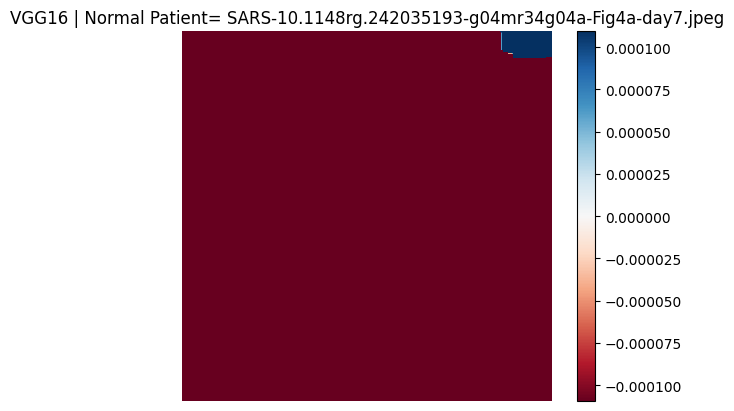

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 6s 6s/step


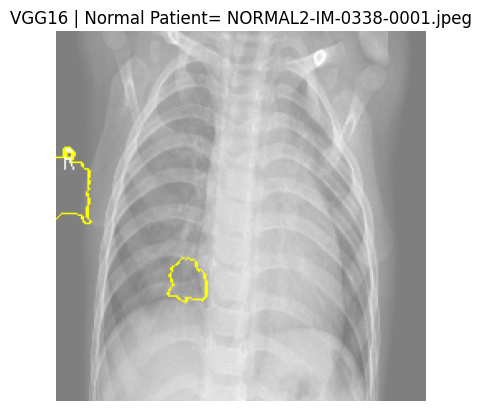

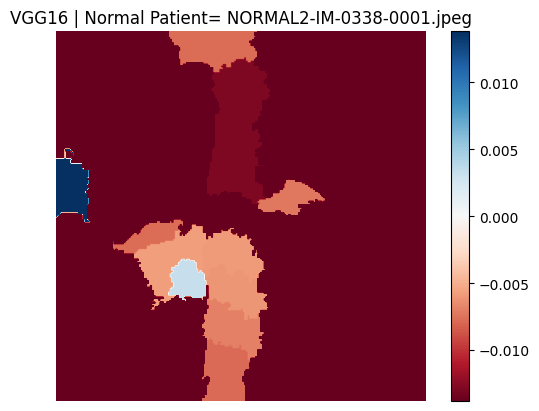

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 8s 8s/step


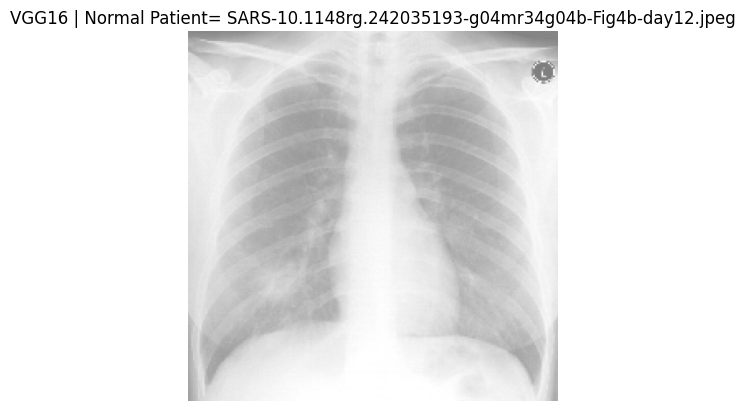

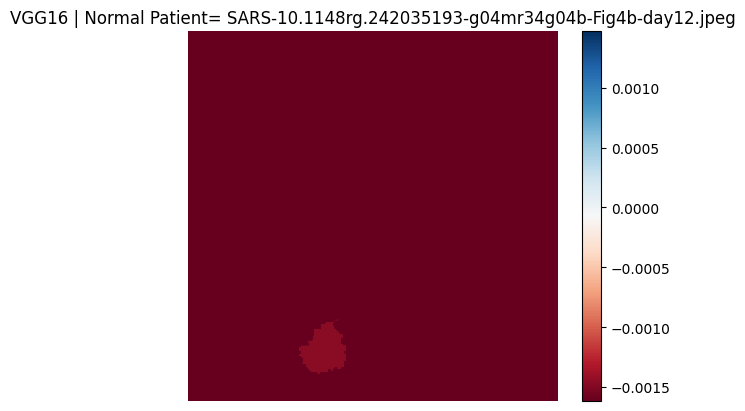

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 5s 5s/step


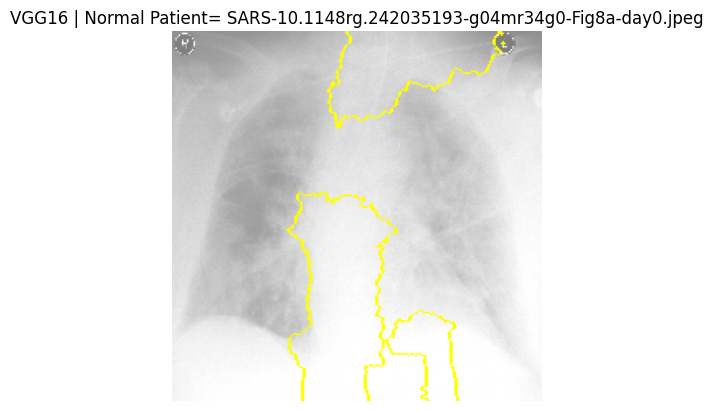

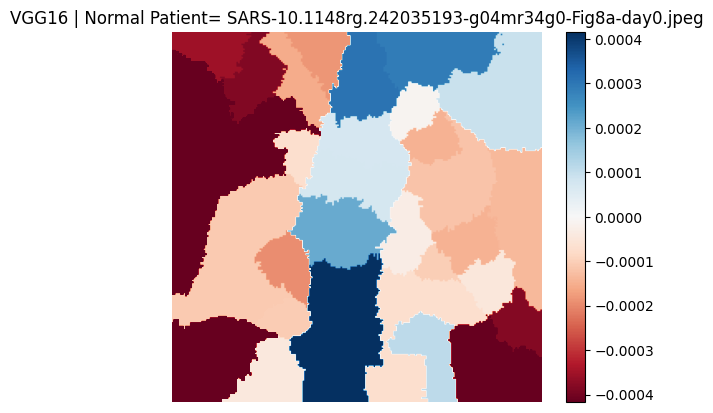

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 5s 5s/step


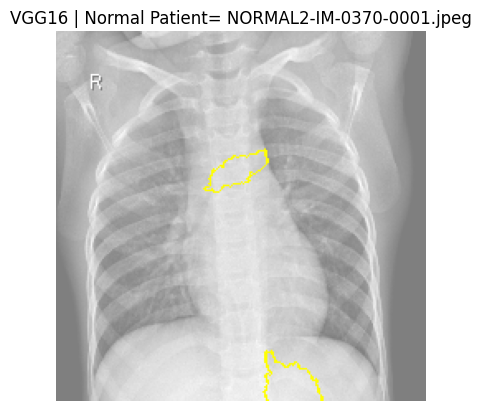

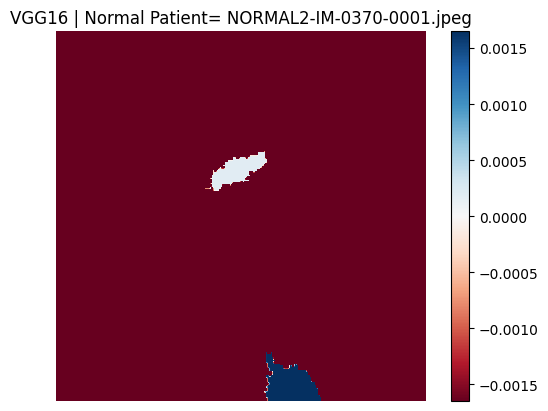

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 7s 7s/step


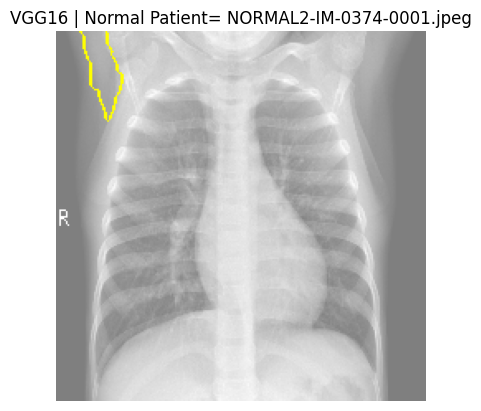

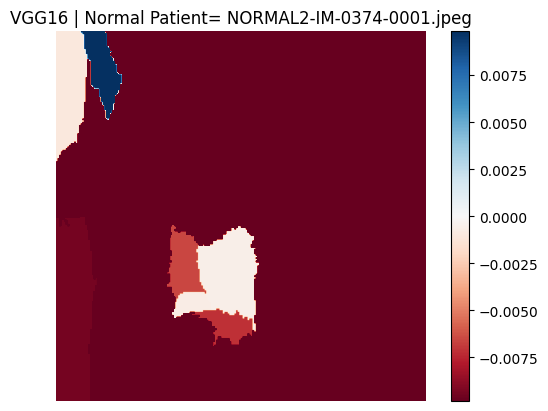

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 6s 6s/step


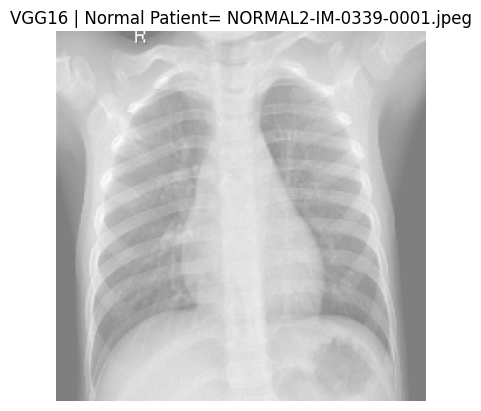

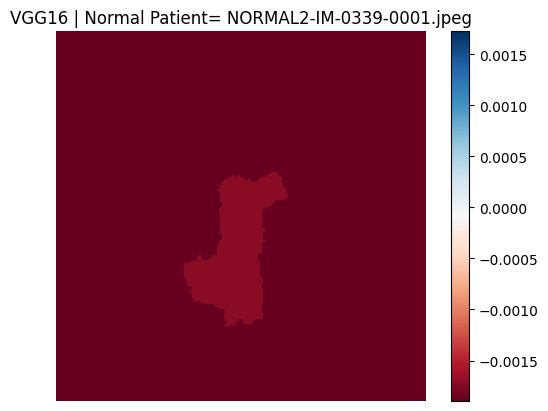

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 5s 5s/step


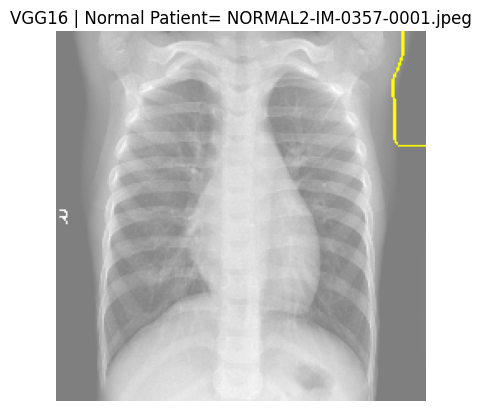

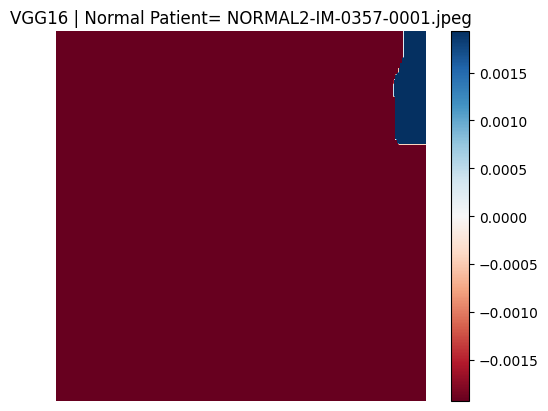

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 8s 8s/step


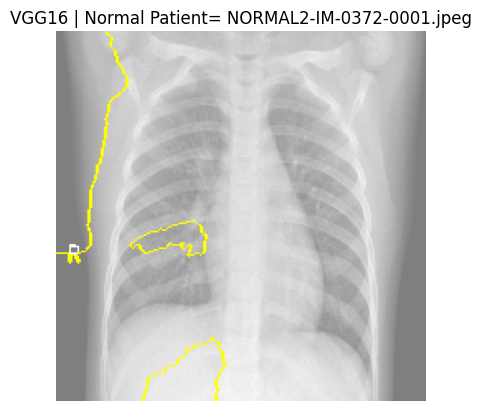

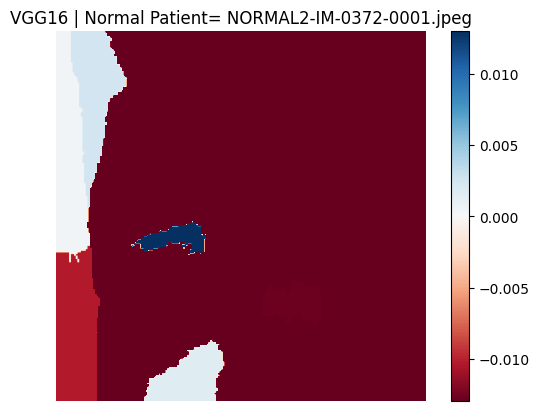

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 5s 5s/step


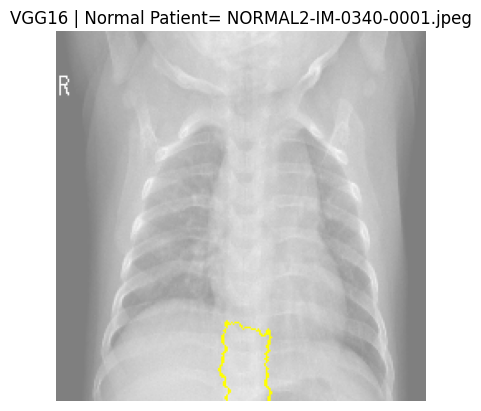

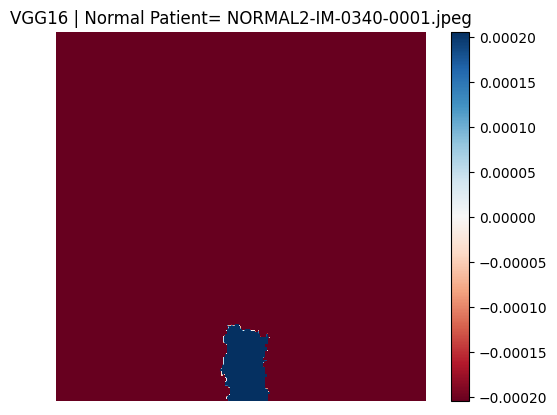

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 7s 7s/step


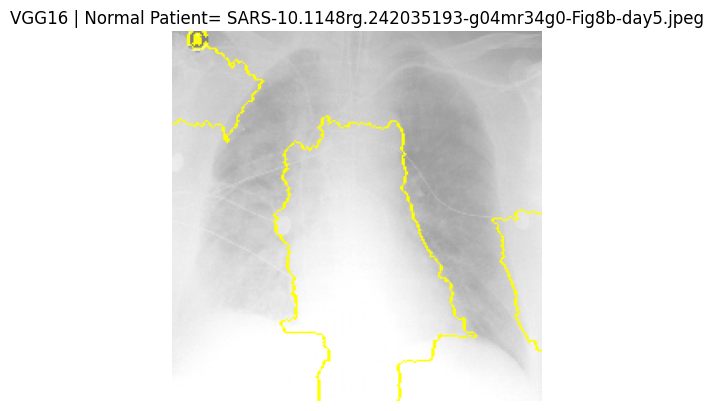

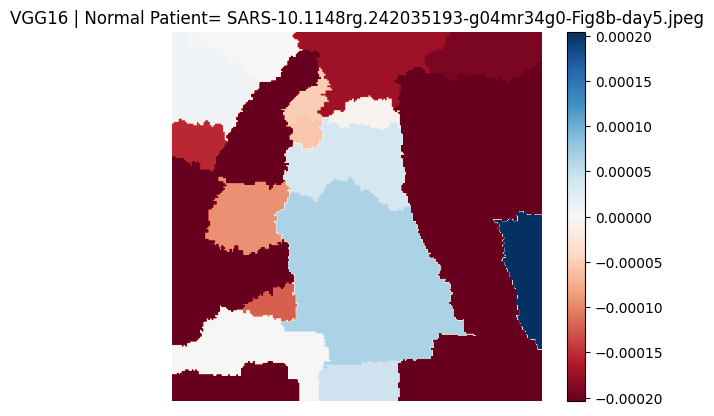

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 7s 7s/step


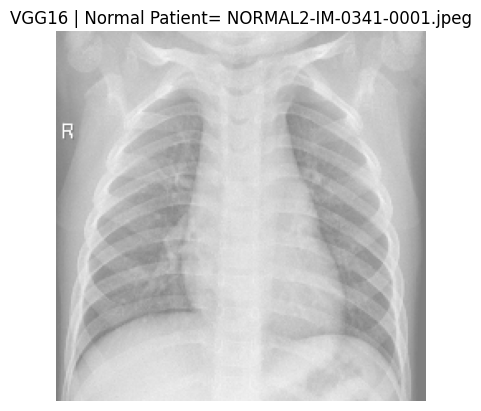

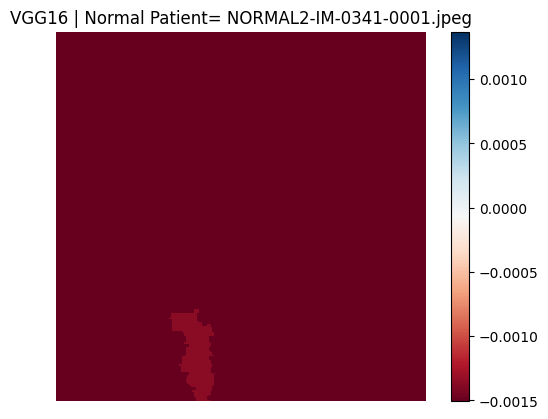

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 5s 5s/step


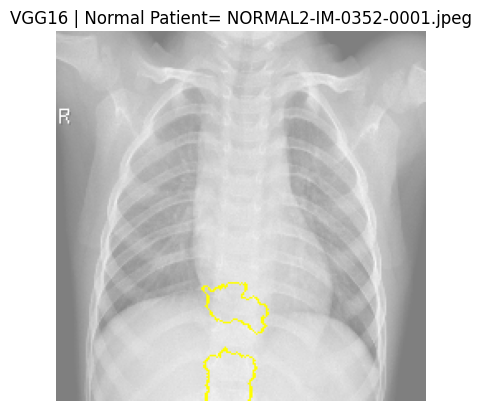

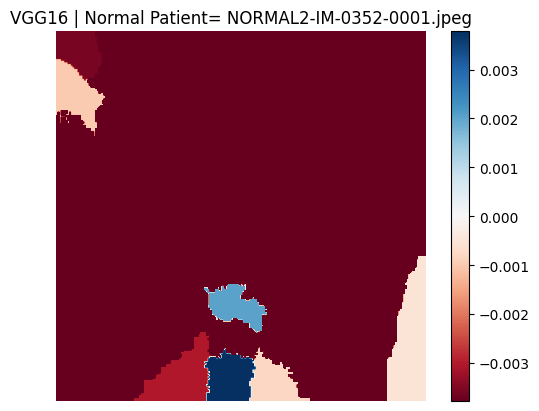

In [ ]:
# Get and visualize LIME explanation VGG16
for normal_img_name, normal_img_arr in normal_img_dict.items():
    explanation = explain_image(vgg16_model, normal_img_arr[0])
    visualize_explanation(explanation, 'VGG16 | Normal Patient= '+normal_img_name)
    visualize_explanation_heatmap(explanation, 'VGG16 | Normal Patient= '+normal_img_name)
    save_explanation(explanation, normal_img_name, 'vgg16')

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 5s 5s/step


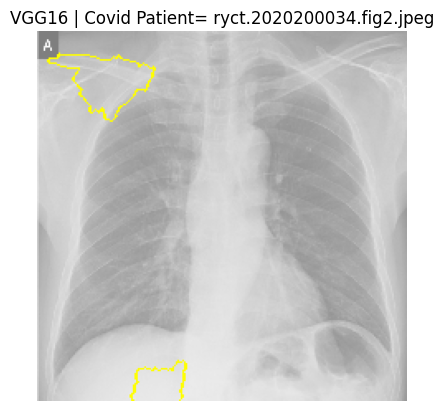

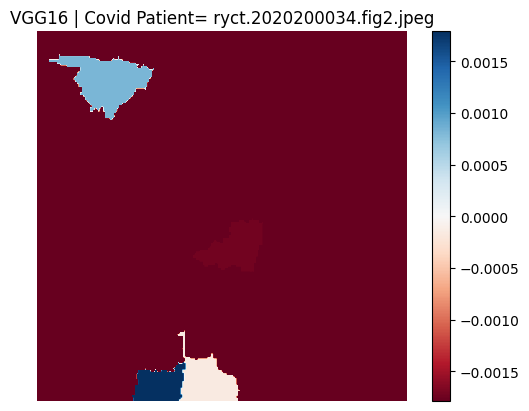

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 5s 5s/step


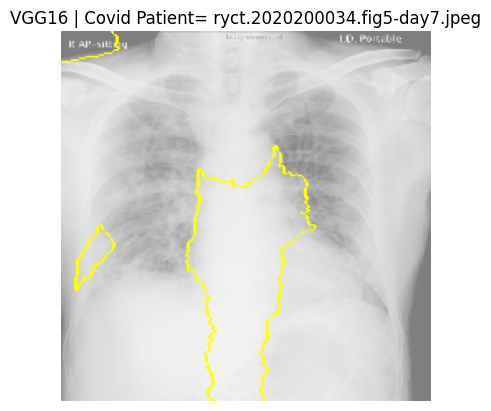

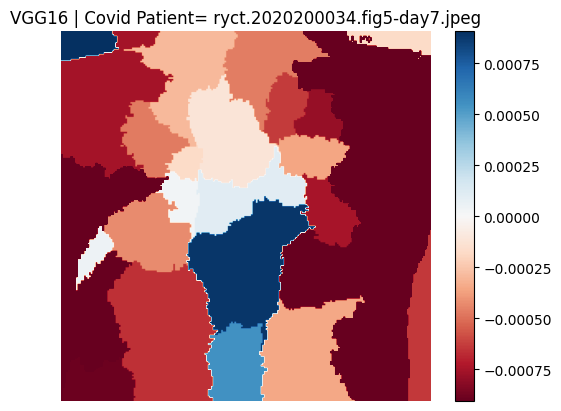

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 5s 5s/step


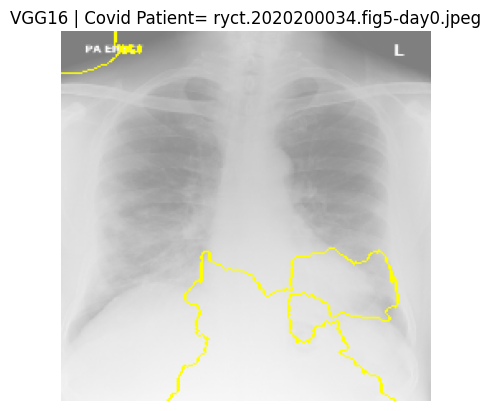

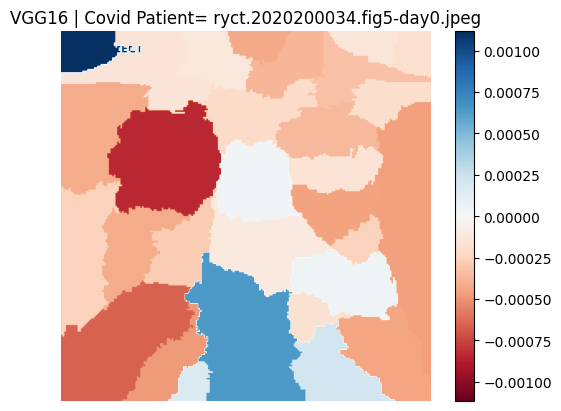

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 7s 7s/step


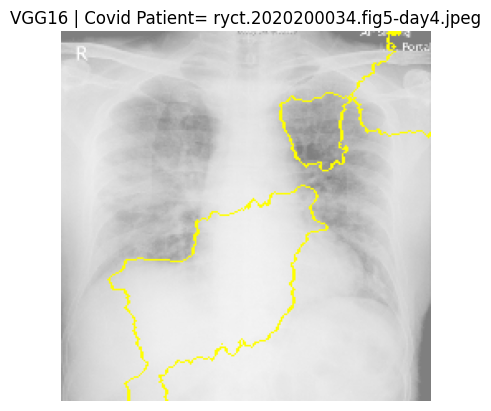

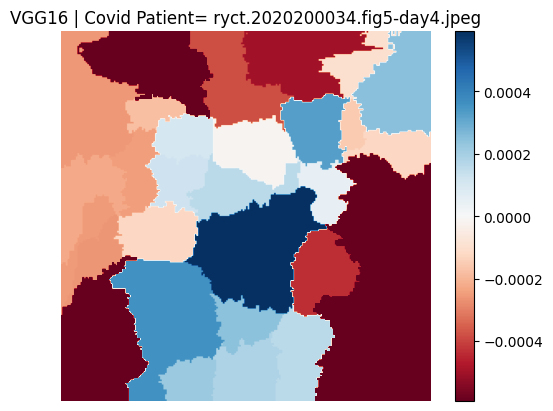

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 5s 5s/step


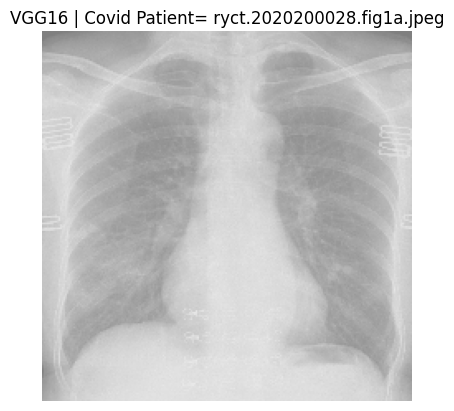

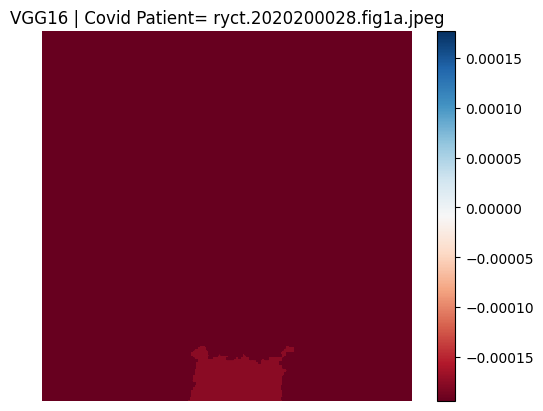

In [ ]:
for covid_img_name, covid_img_arr in covid_img_dict.items():
    explanation = explain_image(vgg16_model, covid_img_arr[0])
    visualize_explanation(explanation, 'VGG16 | Covid Patient= '+covid_img_name)
    visualize_explanation_heatmap(explanation, 'VGG16 | Covid Patient= '+covid_img_name)
    save_explanation(explanation, covid_img_name, 'vgg16')

In [ ]:
normal_image_names = [name for name in test_images_names if not name.startswith('ryct')]
normal_indices = [i for i, name in enumerate(test_images_names) if not name.startswith('ryct')]
normal_gt = [ground_truth[i] for i in normal_indices]

covid_image_names = [name for name in test_images_names if name.startswith('ryct')]
covid_indices = [i for i, name in enumerate(test_images_names) if name.startswith('ryct')]
covid_gt = [ground_truth[i] for i in covid_indices]

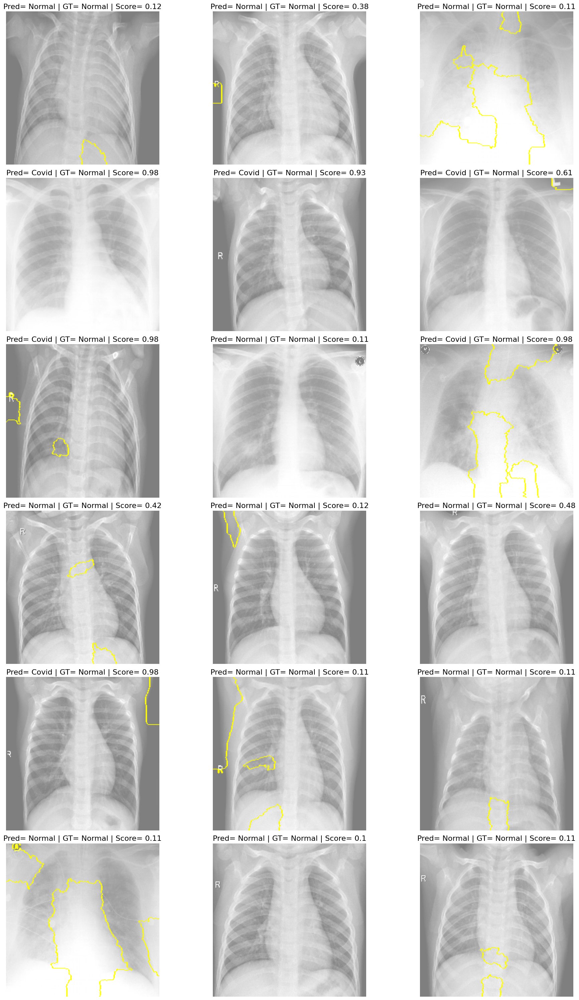

In [ ]:
num_cols = 3
num_rows = (len(normal_image_names) + num_cols - 1) // num_cols  # Calculate number of rows needed

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))

for idx, name in enumerate(normal_image_names):
    row = idx // num_cols
    col = idx % num_cols
    ax = axes[row, col]

    pred_score = round(vgg16_predictions[idx][0],2)
    pred = 'Covid' if pred_score > 0.5 else 'Normal'
    gt = 'Covid' if normal_gt[idx] == 1 else 'Normal'
    exp = load_explanation(name, 'vgg16')
    # title = f'VGG16 | Pred= {pred} | GT= {gt} | Score= {pred_score:.2f} | IMG {name}'
    title = 'Pred= ' + pred  + ' | GT= ' + gt + ' | Score= ' + str(pred_score)

    visualize_explanation_subplot(ax, exp, title)

# Turn off axes for any unused subplots
for i in range(len(test_images_names), num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()


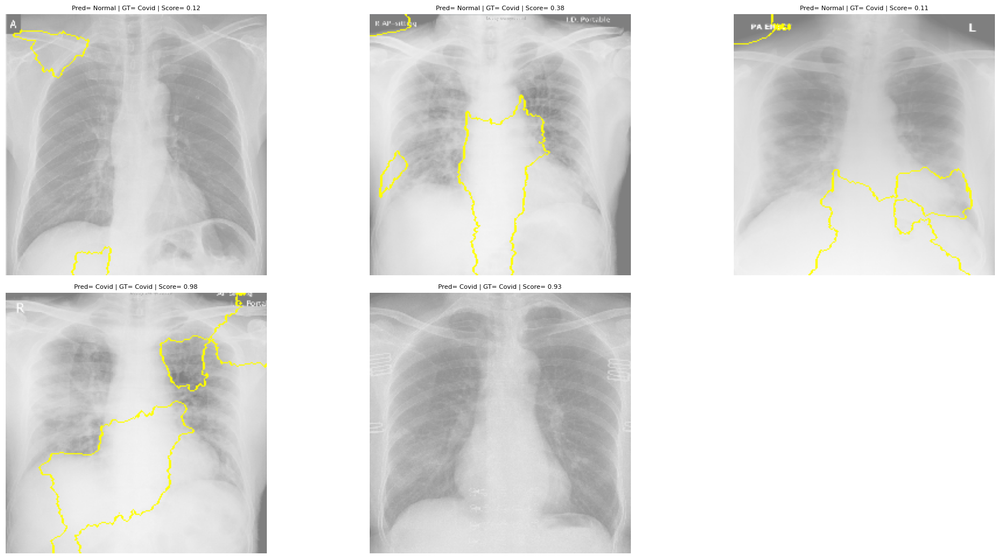

In [ ]:
num_cols = 3
num_rows = (len(covid_image_names) + num_cols - 1) // num_cols  # Calculate number of rows needed

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))

for idx, name in enumerate(covid_image_names):
    row = idx // num_cols
    col = idx % num_cols
    ax = axes[row, col]

    pred_score = round(vgg16_predictions[idx][0],2)
    pred = 'Covid' if pred_score > 0.5 else 'Normal'
    gt = 'Covid' if covid_gt[idx] == 1 else 'Normal'
    exp = load_explanation(name, 'vgg16')
    title = 'Pred= ' + pred  + ' | GT= ' + gt + ' | Score= ' + str(pred_score)

    visualize_explanation_subplot(ax, exp, title)

for i in range(len(covid_image_names), num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

In [ ]:
cnn_model = Sequential()
cnn_model.add(Conv2D(32, (3, 3), activation="relu", input_shape=(224, 224, 3)))
cnn_model.add(MaxPooling2D(pool_size = (2, 2)))
cnn_model.add(Conv2D(32, (3, 3), activation="relu", input_shape=(224, 224, 3)))
cnn_model.add(MaxPooling2D(pool_size = (2, 2)))
cnn_model.add(Conv2D(32, (3, 3), activation="relu", input_shape=(224, 224, 3)))
cnn_model.add(MaxPooling2D(pool_size = (2, 2)))
cnn_model.add(Conv2D(64, (3, 3), activation="relu", input_shape=(224, 224, 3)))
cnn_model.add(MaxPooling2D(pool_size = (2, 2)))
cnn_model.add(Conv2D(64, (3, 3), activation="relu", input_shape=(224, 224, 3)))
cnn_model.add(MaxPooling2D(pool_size = (2, 2)))
cnn_model.add(Flatten())
cnn_model.add(Dense(activation = 'relu', units = 128))
cnn_model.add(Dense(activation = 'relu', units = 64))
cnn_model.add(Dense(activation = 'sigmoid', units = 1))
optimizer = Adam(learning_rate=0.001)
cnn_model.compile(optimizer = optimizer, loss = 'binary_crossentropy', metrics = ['accuracy'])

cnn_hist = cnn_model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=10,
    validation_data=validation_generator,
    validation_steps=validation_steps,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/10
9/9 [==============================] - 45s 4s/step - loss: 0.6914 - accuracy: 0.5451 - val_loss: 0.6694 - val_accuracy: 0.5000 - lr: 0.0010
Epoch 2/10
9/9 [==============================] - 33s 4s/step - loss: 0.6133 - accuracy: 0.6875 - val_loss: 0.5728 - val_accuracy: 0.5000 - lr: 0.0010
Epoch 3/10
9/9 [==============================] - 34s 4s/step - loss: 0.4183 - accuracy: 0.7917 - val_loss: 0.2874 - val_accuracy: 0.8958 - lr: 0.0010
Epoch 4/10
9/9 [==============================] - 34s 4s/step - loss: 0.2106 - accuracy: 0.9236 - val_loss: 0.0796 - val_accuracy: 0.9583 - lr: 0.0010
Epoch 5/10
9/9 [==============================] - 38s 4s/step - loss: 0.1536 - accuracy: 0.9479 - val_loss: 0.0836 - val_accuracy: 0.9583 - lr: 0.0010
Epoch 6/10
9/9 [==============================] - 34s 4s/step - loss: 0.1634 - accuracy: 0.9306 - val_loss: 0.0981 - val_accuracy: 0.9792 - lr: 0.0010
Epoch 7/10
9/9 [==============================] - 34s 4s/step - loss: 0.1597 - accuracy: 0.934

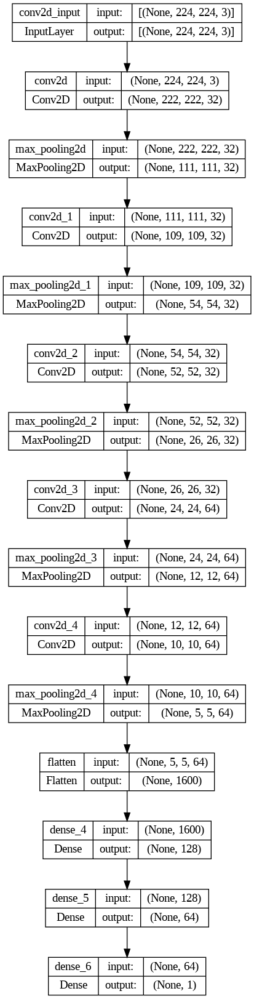

In [ ]:
plot_model(cnn_model, show_shapes=True, show_layer_names=True)

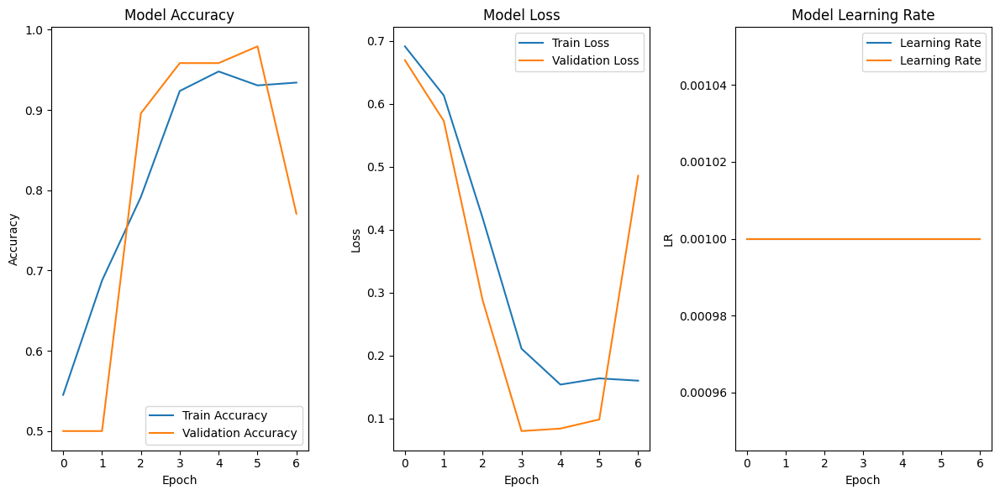

In [ ]:
plot_learning_curves(cnn_hist)

In [ ]:
dir = '/content/drive/MyDrive/NCKU/Healthcare/HW2'
# save_model_to_drive(cnn_model, dir, 'cnn_model.keras')
cnn_model = load_model_from_drive('cnn_model.keras',dir )

Model loaded successfully from: /content/drive/MyDrive/NCKU/Healthcare/HW2/cnn_model.keras


1/1 [==============================] - 1s 1s/step


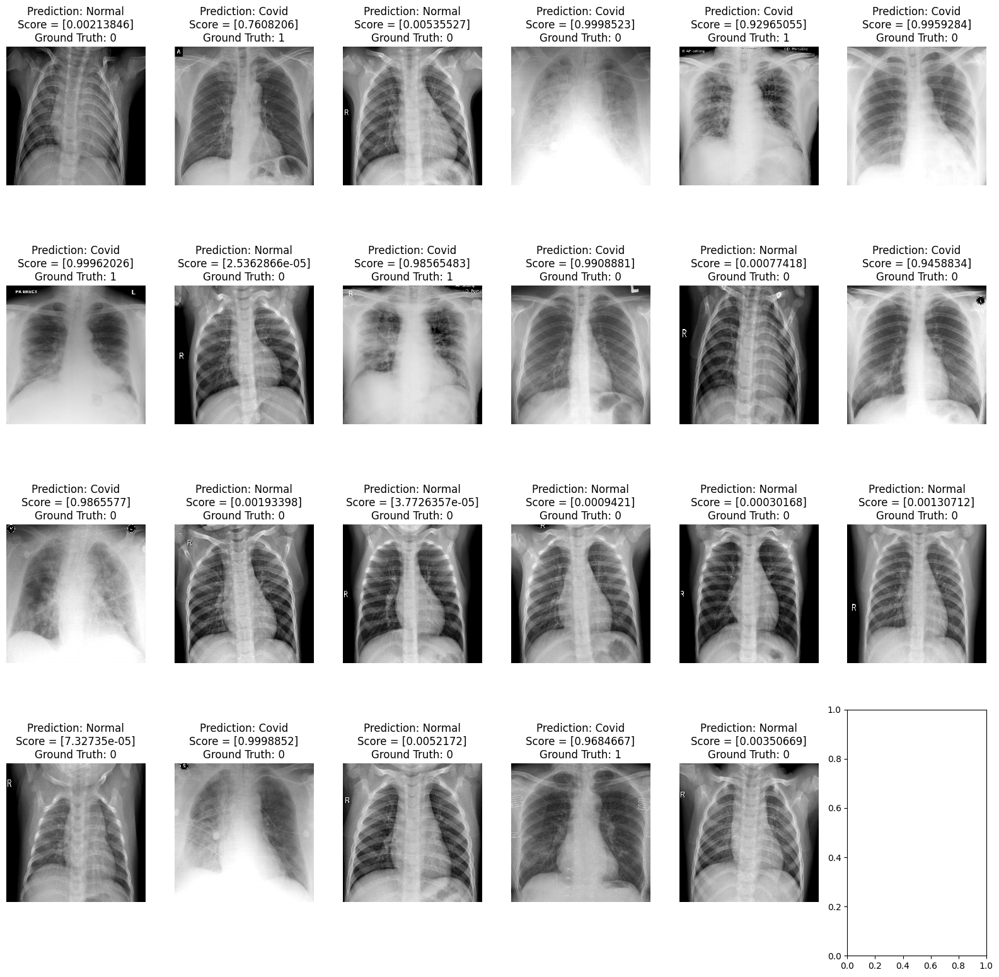

In [ ]:
cnn_predictions,ground_truth = predict(cnn_model, test_images, test_images_names)
plot_predictions(cnn_predictions, ground_truth, test_images)

Accuracy: 0.74, Precision: 0.45, Sensitivity: 1.00, Specificity: 0.67, F1 score: 0.62, ROC AUC: 0.73
True Positives (TP): 5
True Negatives (TN): 12
False Positives (FP): 6
False Negatives (FN): 0


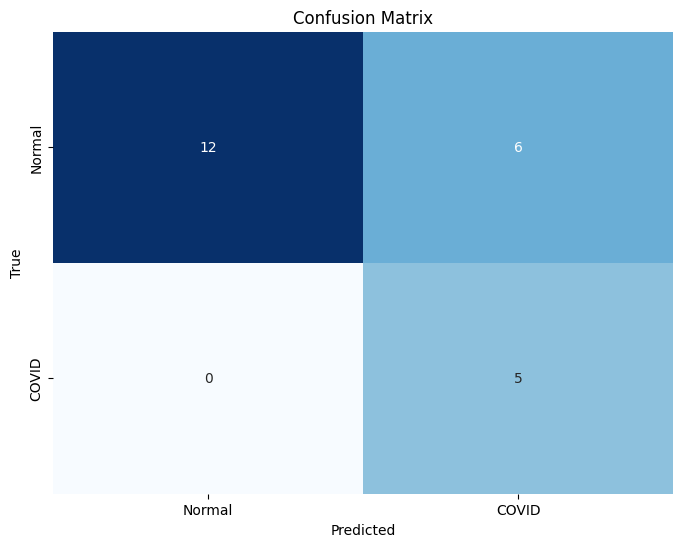

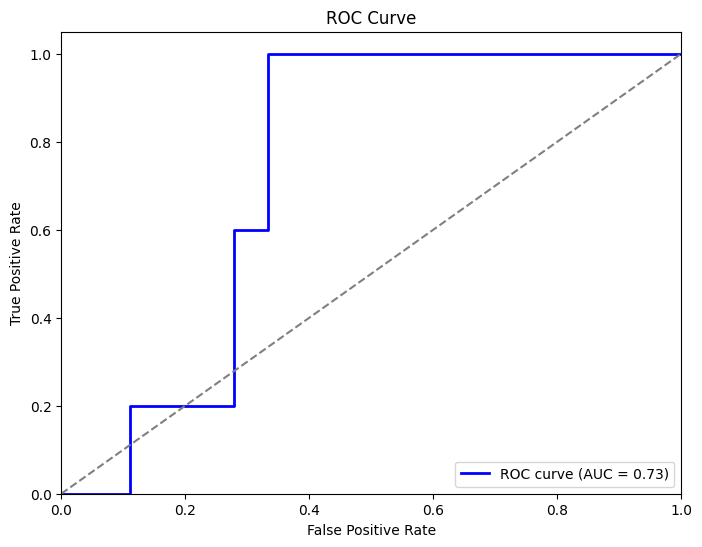

Optimal Threshold: 0.76


In [ ]:
# Calculate evaluation metrics
accuracy, precision, sensitivity,specificity, f1, roc_auc = evaluate_metrics(ground_truth, cnn_predictions)
print(f'Accuracy: {accuracy:.2f}, Precision: {precision:.2f}, Sensitivity: {sensitivity:.2f}, Specificity: {specificity:.2f}, F1 score: {f1:.2f}, ROC AUC: {roc_auc:.2f}')

# Plot confusion matrix
plot_confusion_matrix(ground_truth, cnn_predictions)

# Plot ROC curve
plot_roc_curve(ground_truth, cnn_predictions)

# Find optimal threshold based on ROC AUC
optimal_threshold_cnn = find_optimal_threshold(ground_truth, cnn_predictions)
print(f'Optimal Threshold: {optimal_threshold_cnn:.2f}')

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 207ms/step


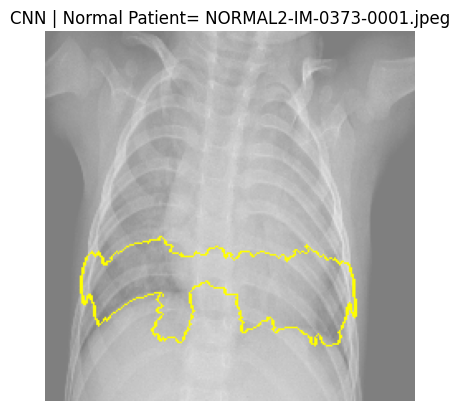

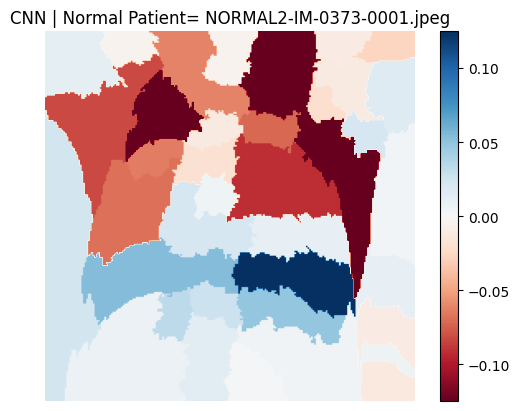

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 266ms/step


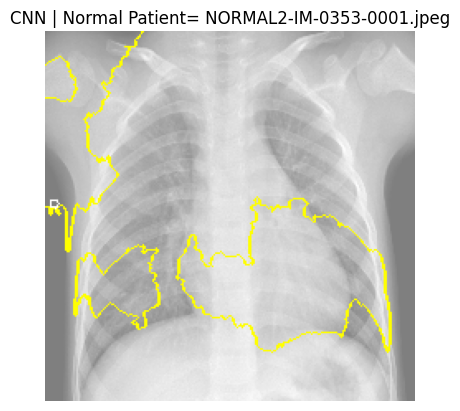

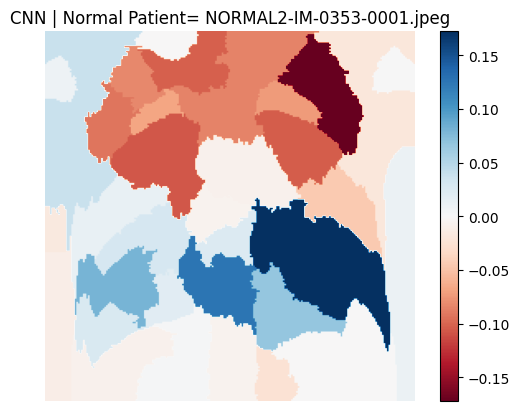

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 187ms/step


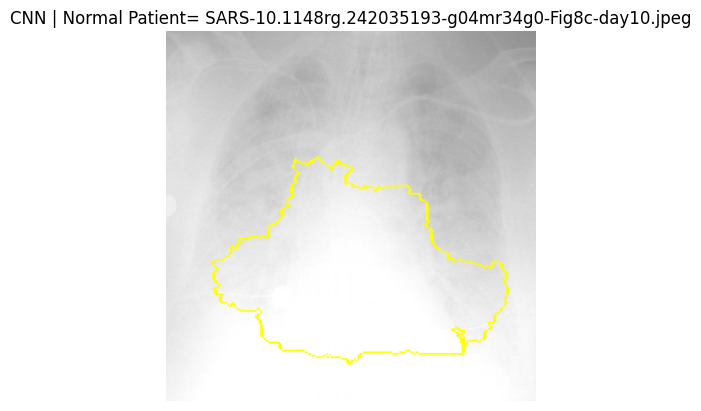

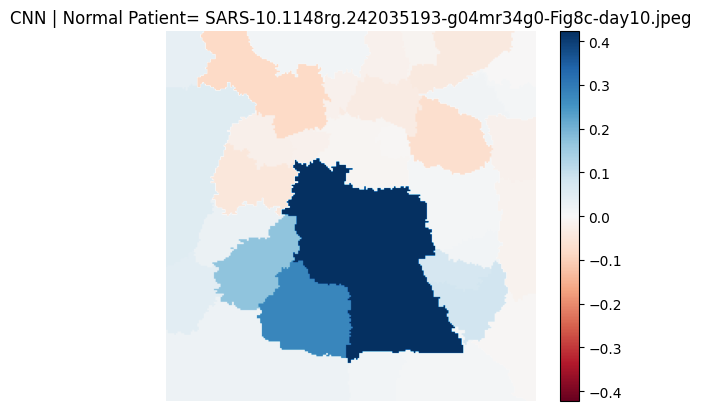

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 178ms/step


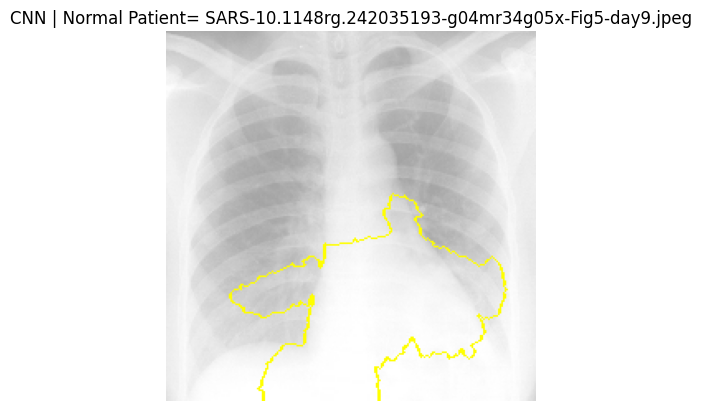

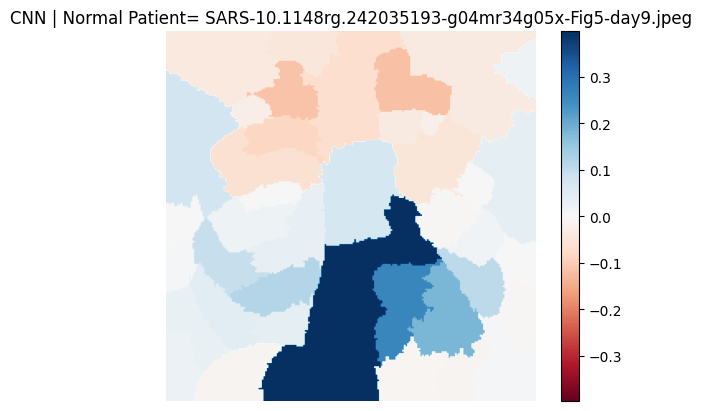

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 309ms/step


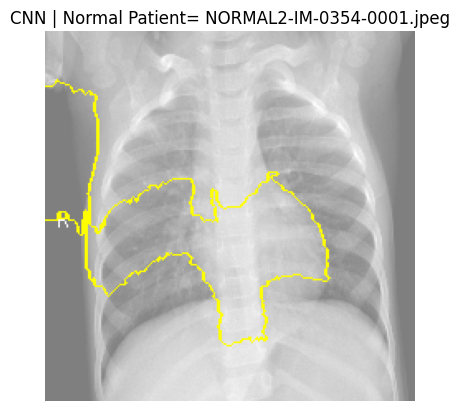

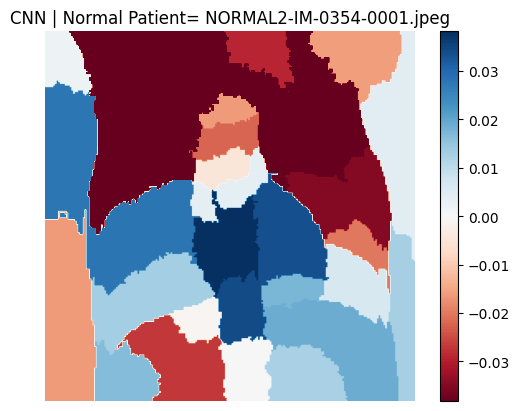

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 193ms/step


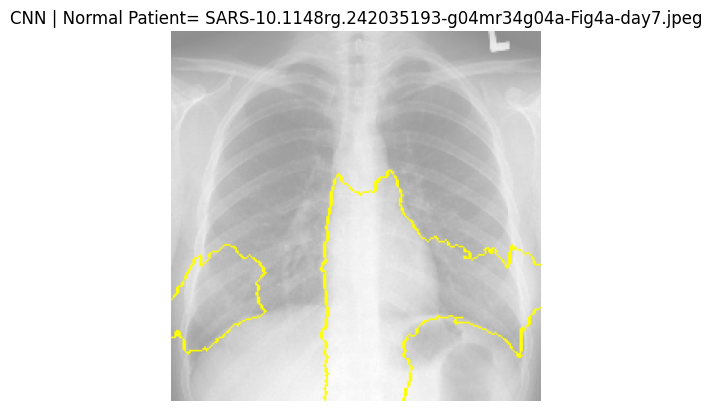

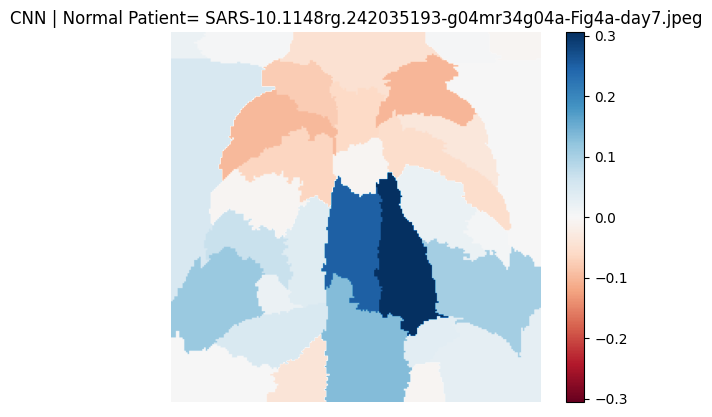

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 313ms/step


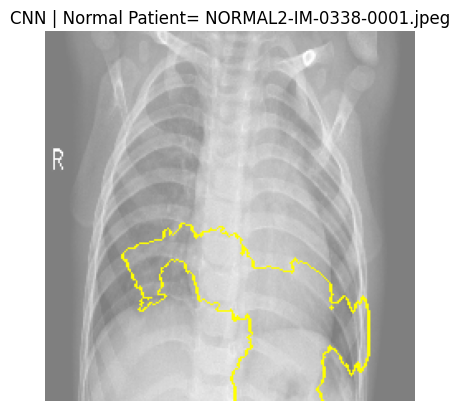

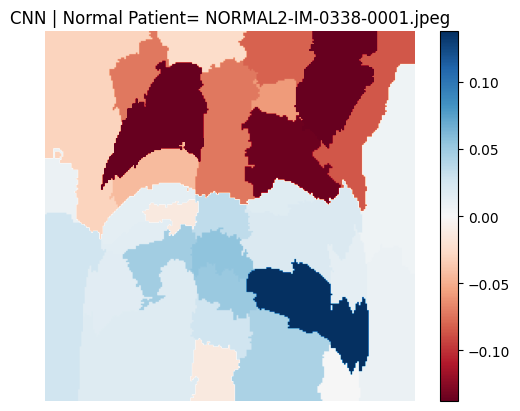

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 353ms/step


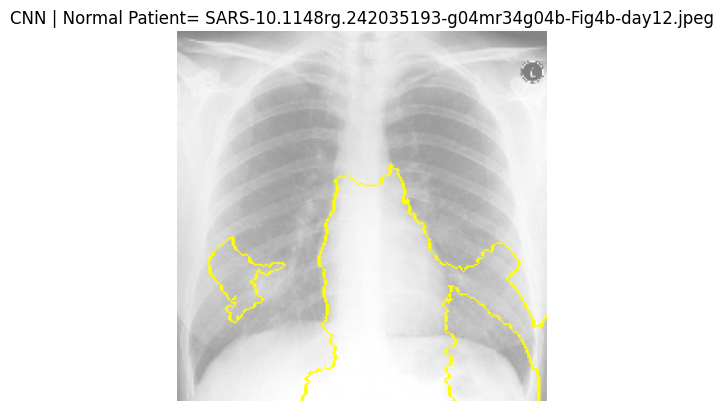

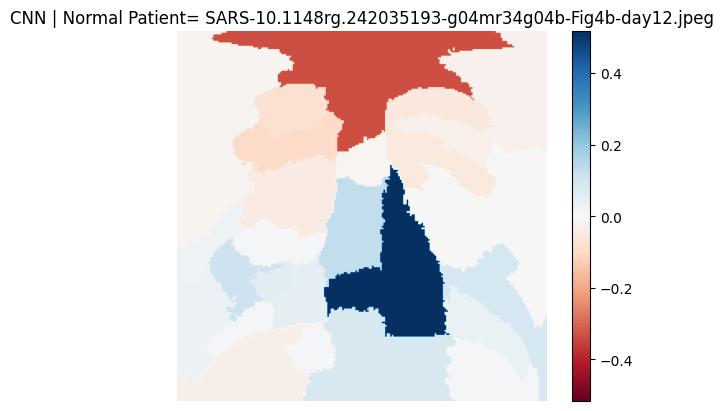

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 179ms/step


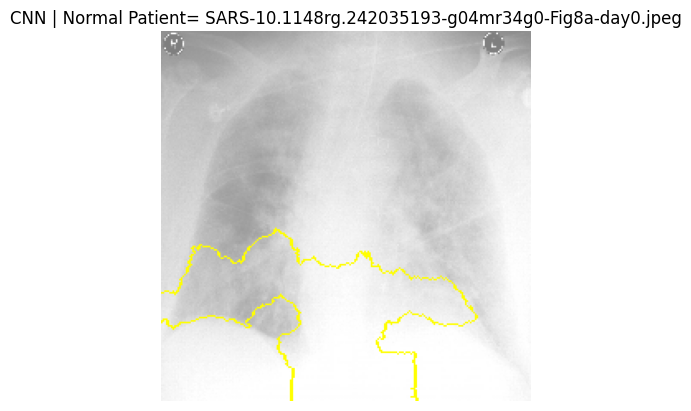

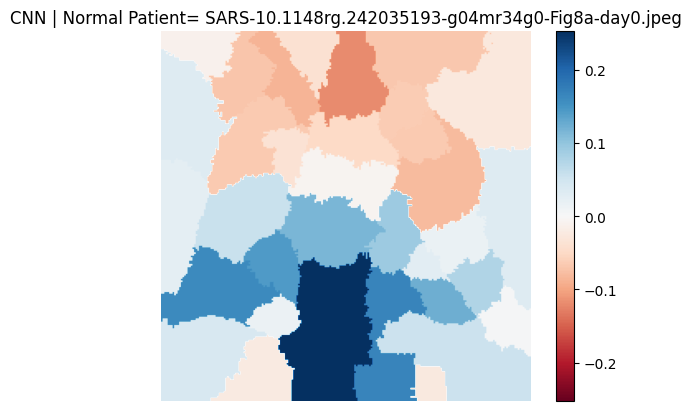

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 290ms/step


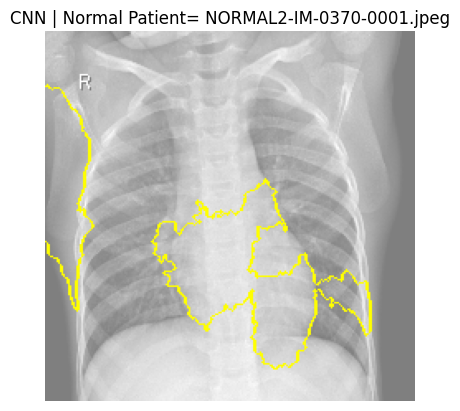

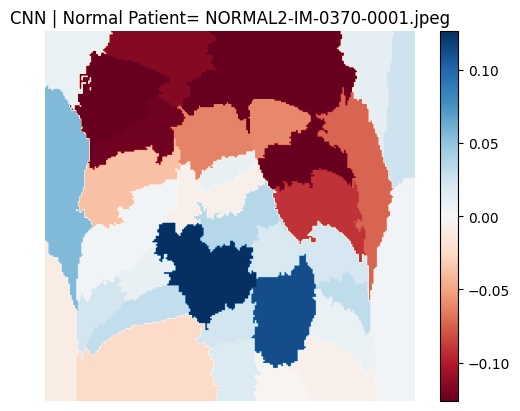

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 304ms/step


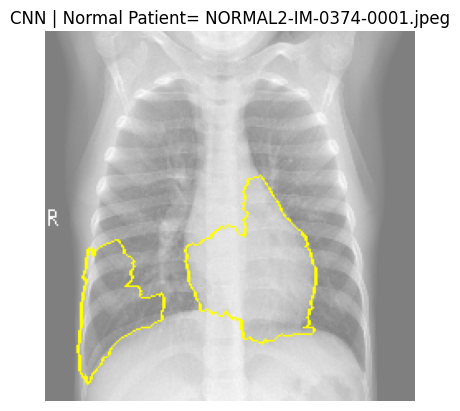

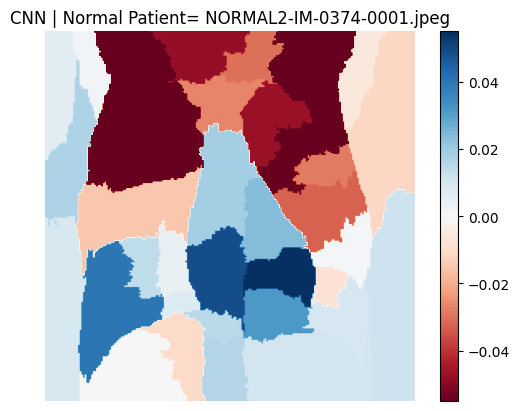

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 192ms/step


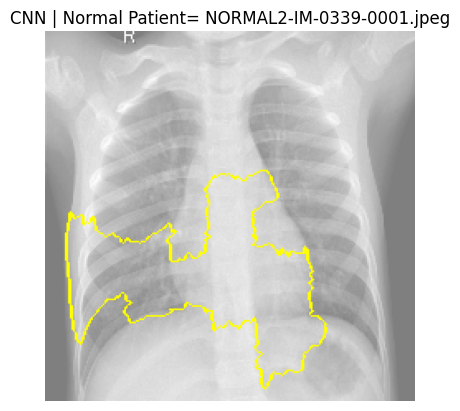

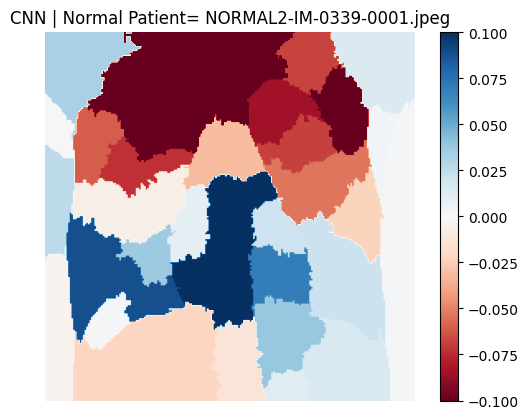

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 225ms/step


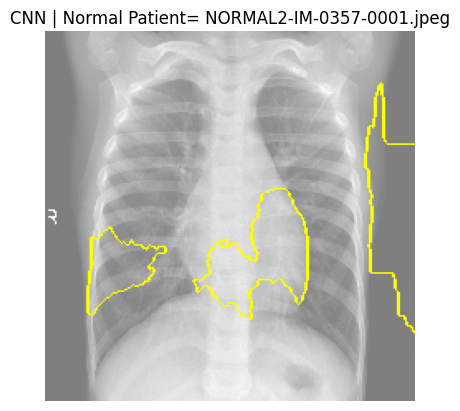

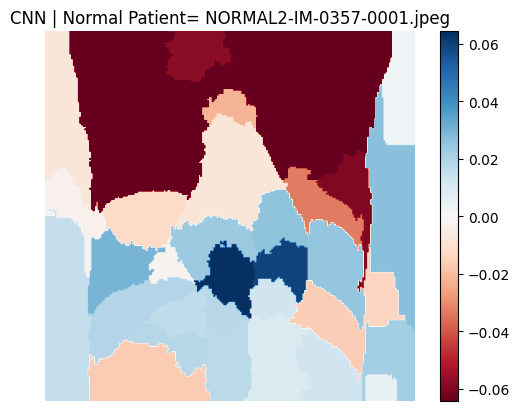

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 357ms/step


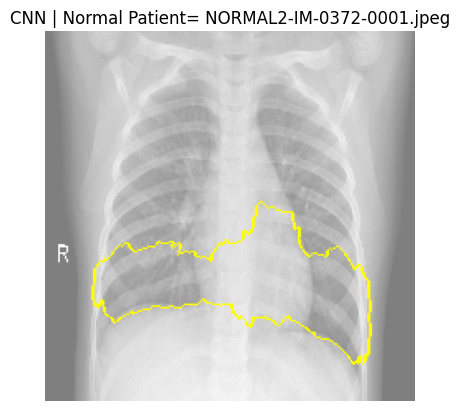

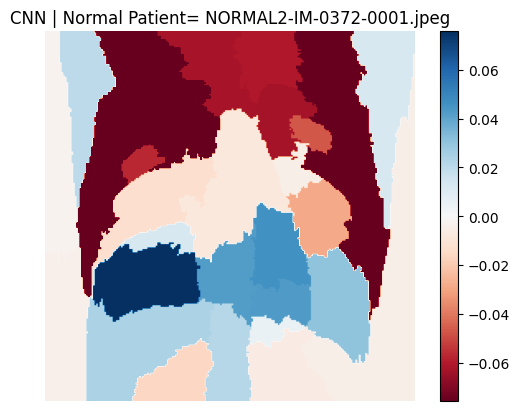

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 188ms/step


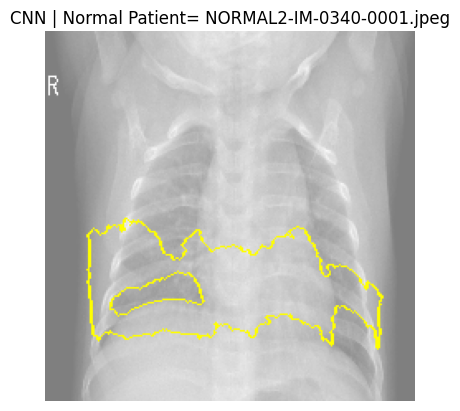

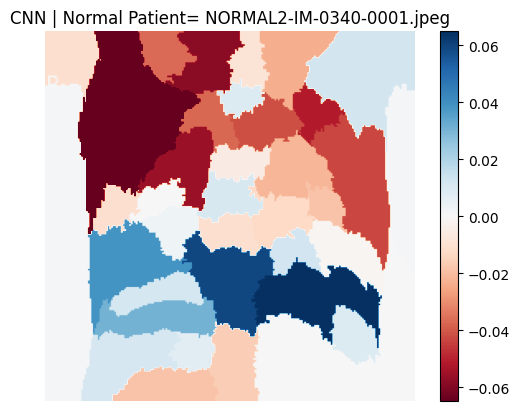

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 217ms/step


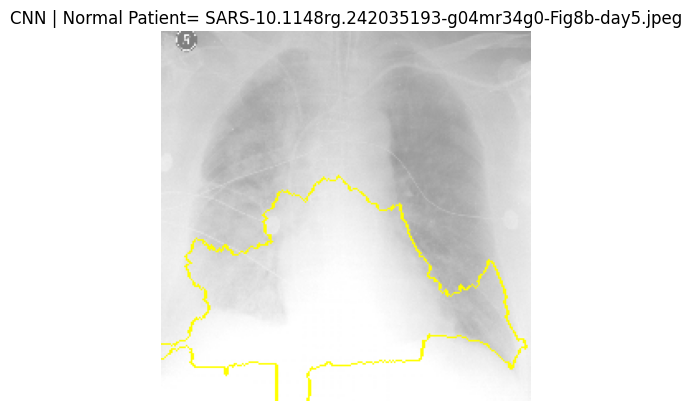

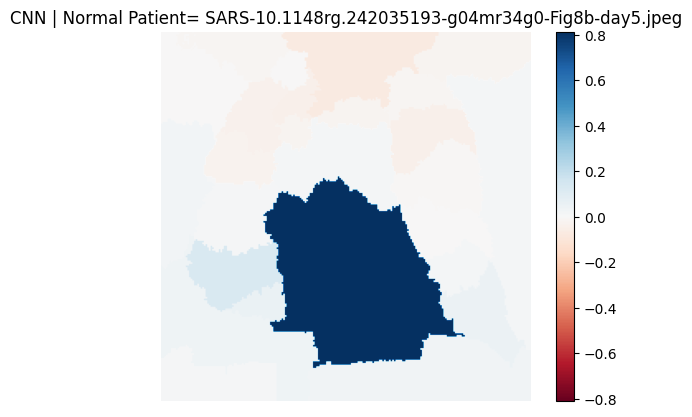

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 248ms/step


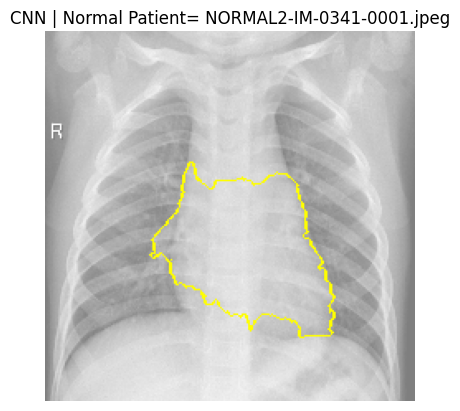

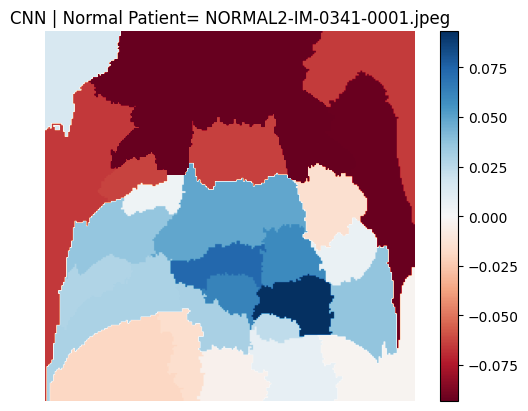

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 193ms/step


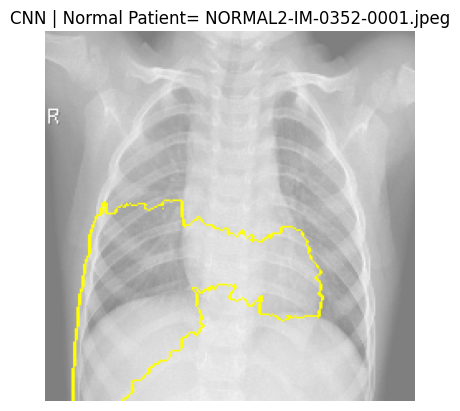

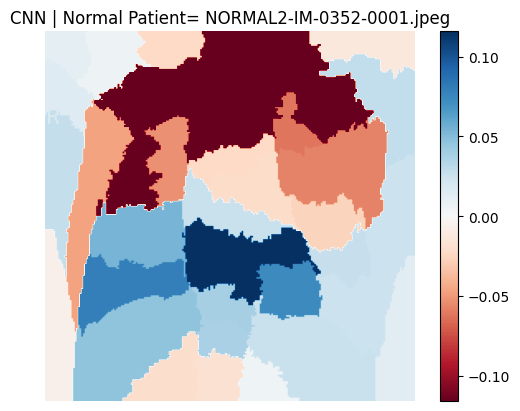

In [ ]:
# Get and visualize LIME explanation
for normal_img_name, normal_img_arr in normal_img_dict.items():
    explanation = explain_image(cnn_model, normal_img_arr[0])
    visualize_explanation(explanation, 'CNN | Normal Patient= '+ normal_img_name)
    visualize_explanation_heatmap(explanation, 'CNN | Normal Patient= '+ normal_img_name)
    save_explanation(explanation, normal_img_name, 'CNN')

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 247ms/step


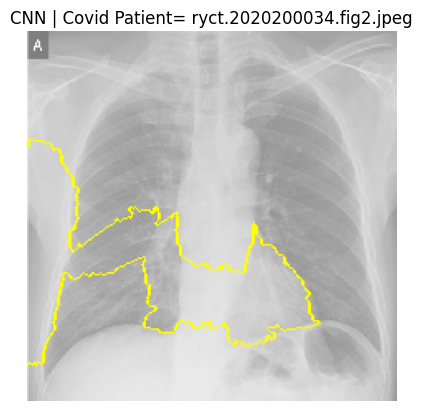

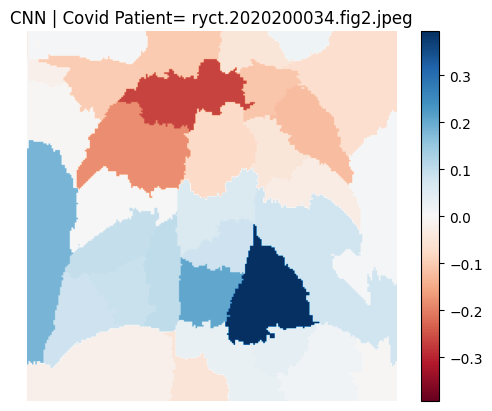

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 177ms/step


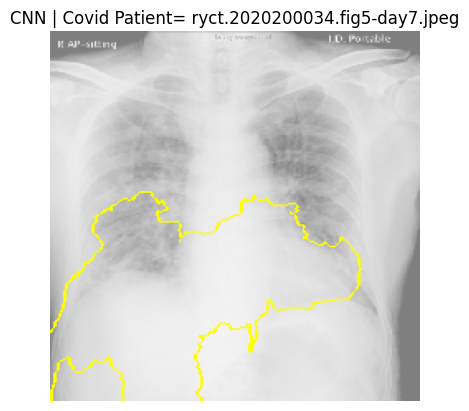

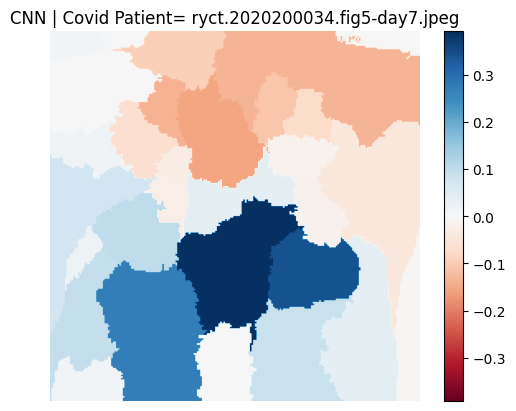

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 177ms/step


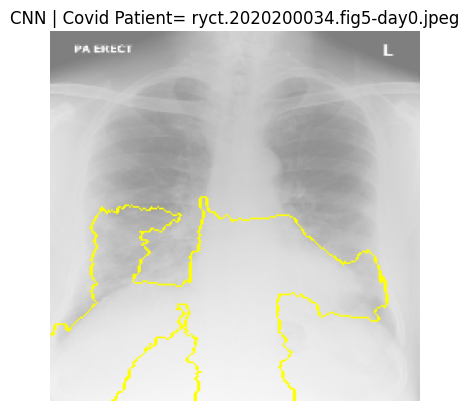

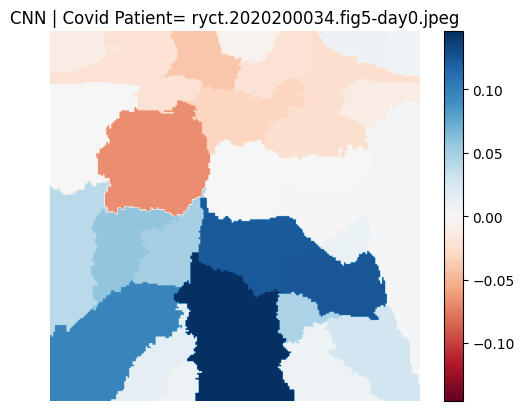

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 175ms/step


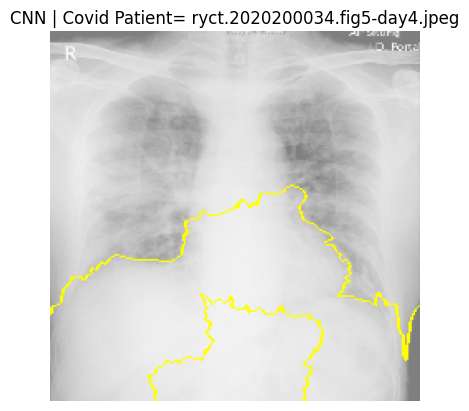

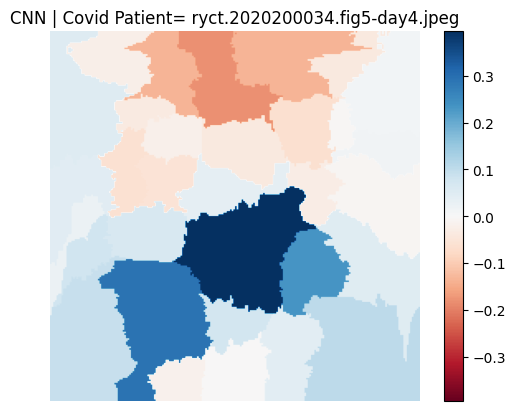

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 306ms/step


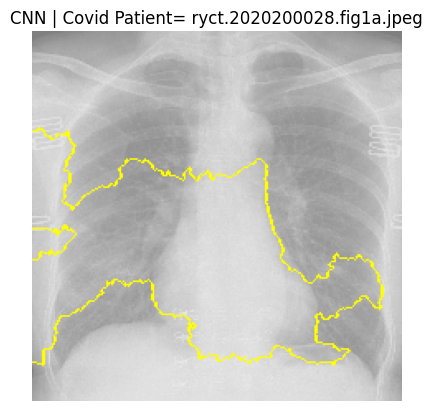

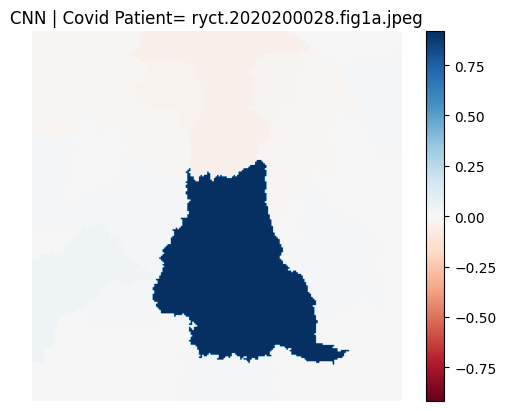

In [ ]:
for covid_img_name, covid_img_arr in covid_img_dict.items():
    explanation = explain_image(cnn_model, covid_img_arr[0])
    visualize_explanation(explanation, 'CNN | Covid Patient= '+covid_img_name)
    visualize_explanation_heatmap(explanation, 'CNN | Covid Patient= '+covid_img_name)
    save_explanation(explanation, covid_img_name, 'CNN')

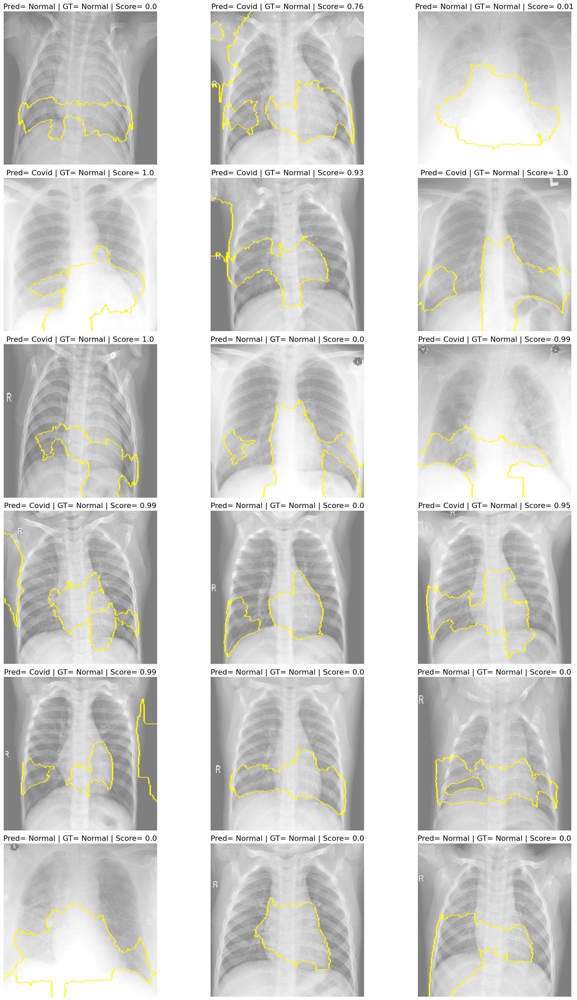

In [ ]:
num_cols = 3
num_rows = (len(normal_image_names) + num_cols - 1) // num_cols  # Calculate number of rows needed

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))

for idx, name in enumerate(normal_image_names):
    row = idx // num_cols
    col = idx % num_cols
    ax = axes[row, col]

    pred_score = round(cnn_predictions[idx][0],2)
    pred = 'Covid' if pred_score > 0.5 else 'Normal'
    gt = 'Covid' if normal_gt[idx] == 1 else 'Normal'
    exp = load_explanation(name, 'cnn')
    title = 'Pred= ' + pred  + ' | GT= ' + gt + ' | Score= ' + str(pred_score)

    visualize_explanation_subplot(ax, exp, title)

for i in range(len(test_images_names), num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()


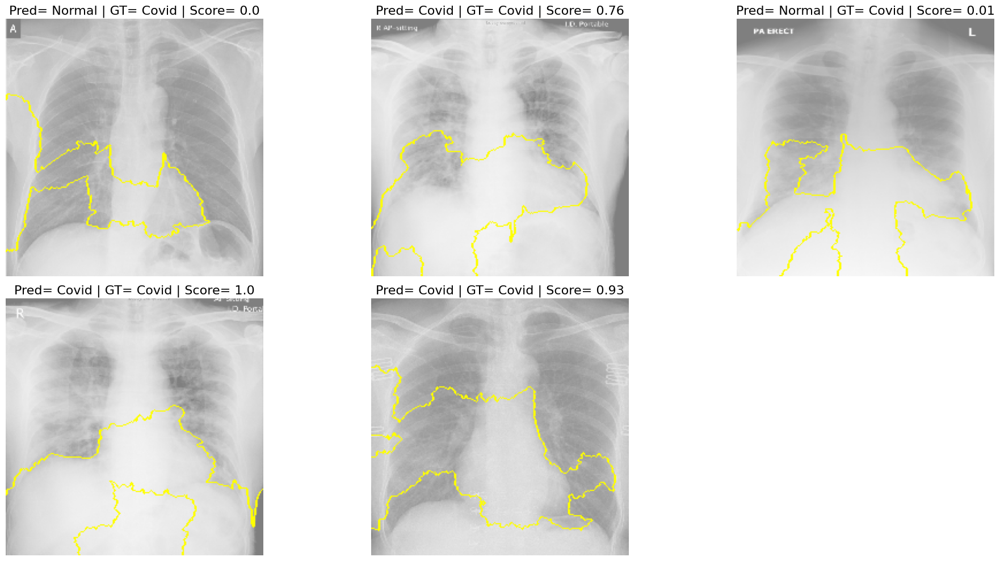

In [ ]:
num_cols = 3
num_rows = (len(covid_image_names) + num_cols - 1) // num_cols  # Calculate number of rows needed

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))

for idx, name in enumerate(covid_image_names):
    row = idx // num_cols
    col = idx % num_cols
    ax = axes[row, col]

    pred_score = round(cnn_predictions[idx][0],2)
    pred = 'Covid' if pred_score > 0.5 else 'Normal'
    gt = 'Covid' if covid_gt[idx] == 1 else 'Normal'
    exp = load_explanation(name, 'cnn')
    title = 'Pred= ' + pred  + ' | GT= ' + gt + ' | Score= ' + str(pred_score)

    visualize_explanation_subplot(ax, exp, title)

for i in range(len(covid_image_names), num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()